In [79]:
using Arpack
using LinearAlgebra
using LaTeXStrings
using Revise
using PyPlot

includet("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/Lattice_setup/lattice_BZ.jl")
includet("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/3P_funcs/patch_methods.jl")
includet("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/AHC_code/3P_funcs/lambda_funcs.jl")

# 3D Band Structure

In [85]:
function mBZ_band_structure(lambda, rs, kappa, V, shells)
    k_list = range(-2 * kappa, 2 * kappa, 10^2)
    mBZ_count = num_mBZ(shells)
    symm_energies = Array{Float64}(undef, length(k_list), length(k_list), mBZ_count)
    for i in 1:length(k_list)
        kx = k_list[i]
        for j in 1:length(k_list)
            ky = k_list[j]
            ham = lambda_symm_ham([kx, ky], lambda, rs, kappa, V, shells)
            symm_energies[i, j, :] = real.(eigvals(Hermitian(ham)))
        end
    end
    asymm_energies = Array{Float64}(undef, length(k_list), length(k_list), mBZ_count)
    for i in 1:length(k_list)
        kx = k_list[i]
        for j in 1:length(k_list)
            ky = k_list[j]
            ham = lambda_asymm_ham([kx, ky], lambda, rs, kappa, V, shells)
            asymm_energies[i, j, :] = real.(eigvals(Hermitian(ham)))
        end
    end

    fig = figure()
    ax = fig.add_subplot(111, projection="3d")
    ax.plot_surface(k_list, k_list, symm_energies[:, :, 1], cmap="viridis")  # You can change the colormap
    xlabel("x")
    ylabel("y")
    ax.set_zlabel("z")
    title("3D Surface Plot")
    display(gcf())
    # fig = Figure(size=(2500, 1200), fontsize=50, figure_padding = 20)
    # rowgap!(fig.layout, 20)
    # colgap!(fig.layout, 20)
    # ax = Axis3(fig[1, 1]; xlabel=L"k_x", ylabel=L"k_y", zlabel="", title=L" \epsilon_\text{symm}(k_x, k_y) \text{ vs } (k_x, k_y)", 
    # titlegap = -25, xlabeloffset = 90, ylabeloffset = 90)
    # ax.elevation[] = pi/9

    # index1 = 1
    # index2 = 2

    # # Now we need to properly set limits and plot the actual bands
    # # I think 2 bands is usually just right for comparison
    # zmin = minimum(vcat(symm_energies[:, :, index1], symm_energies[:, :, index2]))
    # zmax = maximum(vcat(symm_energies[:, :, index1], symm_energies[:, :, index2]))
    # zabs = maximum(abs.([zmin, zmax]))

    # tr = surface!(ax, k_list, k_list, symm_energies[:, :, index1], colormap = :RdBu, colorrange = (-zabs, zabs))
    # tr = surface!(ax, k_list, k_list, symm_energies[:, :, index2], colormap = :RdBu, colorrange = (-zabs, zabs))

    # cb1 = Colorbar(fig[1, 2], tr)

    

    # zmin = minimum(vcat(asymm_energies[:, :, index1], asymm_energies[:, :, index2]))
    # zmax = maximum(vcat(asymm_energies[:, :, index1], asymm_energies[:, :, index2]))
    # zabs = maximum(abs.([zmin, zmax]))
    
    # ax1 = Axis3(fig[1, 3]; xlabel=L"k_x", ylabel=L"k_y", zlabel="", title=L" \epsilon_\text{asymm}(k_x, k_y) \text{ vs } (k_x, k_y)", 
    # titlegap = -25, xlabeloffset = 90, ylabeloffset = 90)
    # ax1.elevation[] = pi/9

    # tr = surface!(ax1, k_list, k_list, asymm_energies[:, :, index1], colormap = :RdBu, colorrange = (-zabs, zabs))
    # tr = surface!(ax1, k_list, k_list, asymm_energies[:, :, index2], colormap = :RdBu, colorrange = (-zabs, zabs))

    # cb1 = Colorbar(fig[1, 4], tr)
    # # surface!(ax, k_list, k_list, energies[:, :, 2], axis=(type=Axis3,))
    # # surface!(ax, k_list, k_list, energies[:, :, 3], axis=(type=Axis3,))

    # fig
end

mBZ_band_structure (generic function with 1 method)

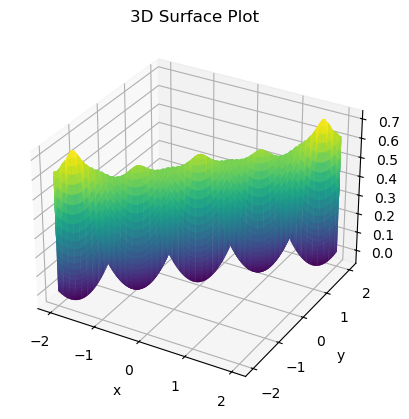

In [86]:
lambda = 1
rs = 1
kappa = 1
V = 0.7
shells = 3
mBZ_band_structure(lambda, rs, kappa, V, shells)

# Energy gaps

In [4]:
function plot_gaps(rs, kappa, shells)
    fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\epsilon_\text{gap} \text{ vs } (\lambda, V)", xlabel = L"\lambda", ylabel = L"V")
    lambda_list = range(0, 3, 2 * 10^2)
    V_list = range(0.001, 1, 2 * 10^2)
    grid = mesh_grid(lambda_list, V_list, Float64)
    mBZ_count = num_mBZ(shells)
    gaps = []

    for i in 1:length(lambda_list)
        lambda = lambda_list[i]
        for j in 1:length(V_list)
            V = V_list[j]
            ham = lambda_symm_ham(kappa * [1, 0], lambda, rs, kappa, V, shells)
            push!(gaps, real.(eigvals(Hermitian(ham))[1] - eigvals(Hermitian(ham))[2]))
        end
    end

    zmax, zmin = maximum(gaps), minimum(gaps)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 10)

    tr1 = tricontourf!(ax1, grid[:, 1], grid[:, 2], log10.(abs.(gaps)), colormap = :RdBu)
    cb1 = Colorbar(fig[1, 2], tr1)

    fig
end

plot_gaps (generic function with 1 method)

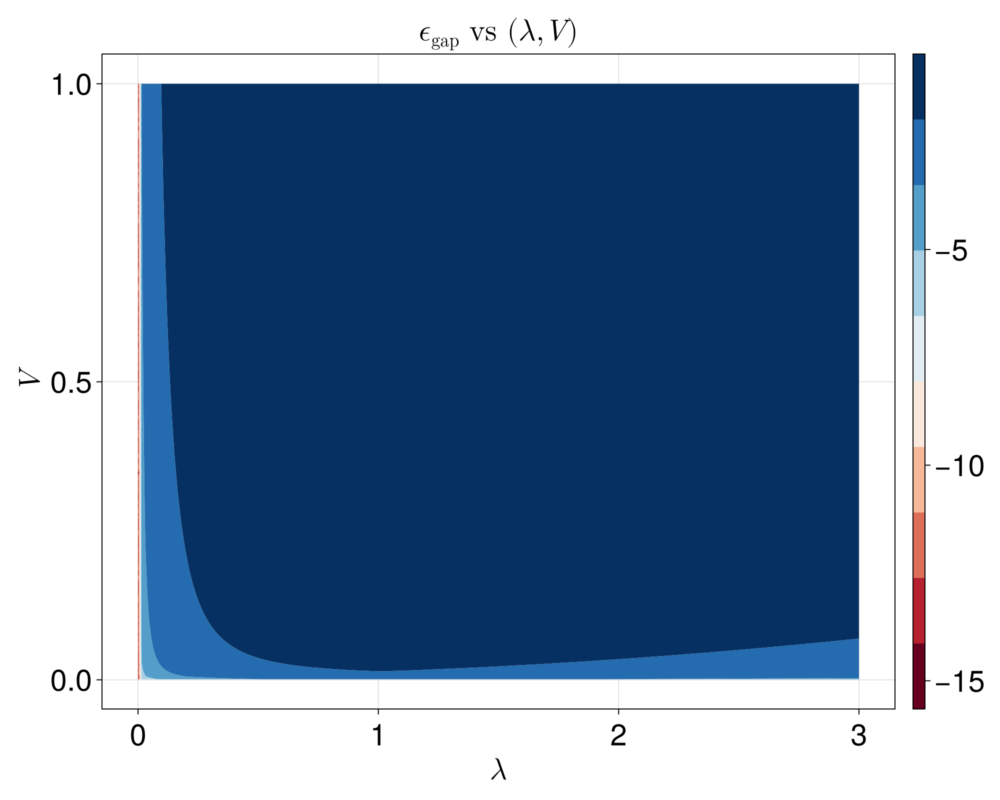

In [5]:
rs = 1
kappa = 1
shells = 5
plot_gaps(rs, kappa, shells)

# Energy line cuts

In [111]:
function plot_symm_gap_shells(q, lambda, rs, kappa, V)
    shell_list = 1:20
    gaps = Array{Float64}(undef, length(shell_list))
    for i in 1:length(shell_list)
        shells = shell_list[i]
        ham = lambda_ham(q, lambda, rs, kappa, V, shells)
        vals = eigvals(Hermitian(ham))
        gaps[i] = real.(vals[1] - vals[2])
    end
    
    figure()
    plot(shell_list, gaps)
    display(gcf())

    fig
end

plot_symm_gap_shells (generic function with 1 method)

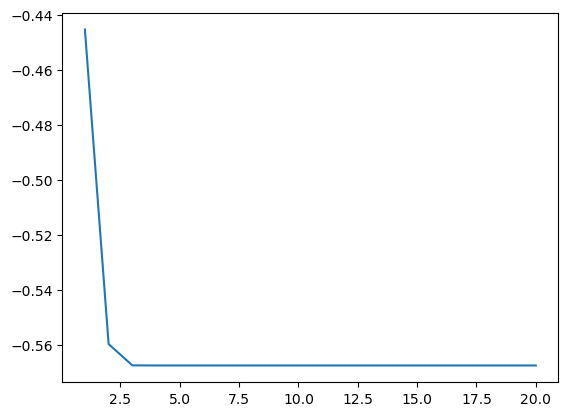

PyObject <matplotlib.collections.QuadMesh object at 0x14b44bc10>

In [112]:
q = kappa * [1, 0]
lambda = 1
rs = 1
kappa = 1
V = [[1, 0] [0, 1]]
plot_symm_gap_shells(q, lambda, rs, kappa, V)

In [9]:
function plot_symm_gap_V(q, lambda, rs, kappa, shells)
    V_list = range(0.001, 1, 10^2)
    gaps = Array{Float64}(undef, length(V_list))
    for j in 1:length(V_list)
        V = V_list[j]
        ham = lambda_symm_ham(q, lambda, rs, kappa, V, shells)
        vals = eigvals(Hermitian(ham))
        gaps[j] = real(vals[1] - vals[2])
    end
    fig = Figure(size=(3300, 1500), fontsize=50)
    ax = Axis(fig[1, 1]; xlabel=L"\log_{10}(V)", ylabel=L"\epsilon_\text{gap}", title=L" \epsilon_\text{gap} \text{ vs } \log_{10}(V)")
    lines!(ax, log10.(V_list), gaps, label = L"gap")
    fig
end

plot_symm_gap_V (generic function with 1 method)

In [114]:
function plot_gap_lambda(q, rs, kappa, shells, V)
    lambda_list = range(0.5, 4.5, 10^2)
    gaps = Array{Float64}(undef, length(lambda_list))
    for j in 1:length(lambda_list)
        lambda = lambda_list[j]
        ham = lambda_ham(q, lambda, rs, kappa, V, shells)
        vals = eigvals(Hermitian(ham))
        gaps[j] = real(vals[1] - vals[2])
    end
    # fig = Figure(size=(3300, 1500), fontsize=50)
    # ax = Axis(fig[1, 1]; xlabel=L"\lambda", ylabel=L"\epsilon_\text{gap}", title=L" \epsilon_\text{gap} \text{ vs } \lambda")
    # lines!(ax, lambda_list, gaps, label = L"gap")

    figure()
    plot(lambda_list, gaps)
    display(gcf())
end

plot_gap_lambda (generic function with 1 method)

In [105]:
q = kappa * [1, 0]
lambda = 1
rs = 1
kappa = 1
shells = 10
plot_symm_gap_V(q, lambda, rs, kappa, shells)

UndefVarError: UndefVarError: `plot_symm_gap_V` not defined

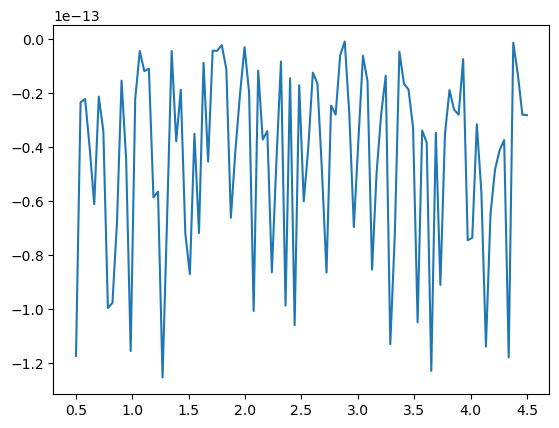

In [116]:
q = kappa * [1, 0]
rs = 1
kappa = 1
shells = 5
V = [[1, 0] [0, 0]]
plot_gap_lambda(q, rs, kappa, shells, V)

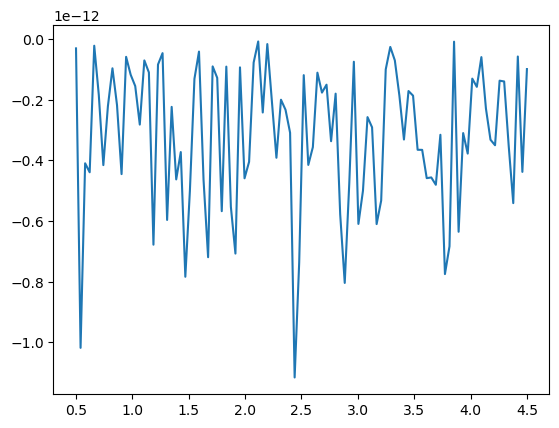

In [110]:
q = kappa * [1, 0]
rs = 1
kappa = 1
shells = 10
V = [[1, 0] [0, 0]]
plot_gap_lambda(q, rs, kappa, shells, V)

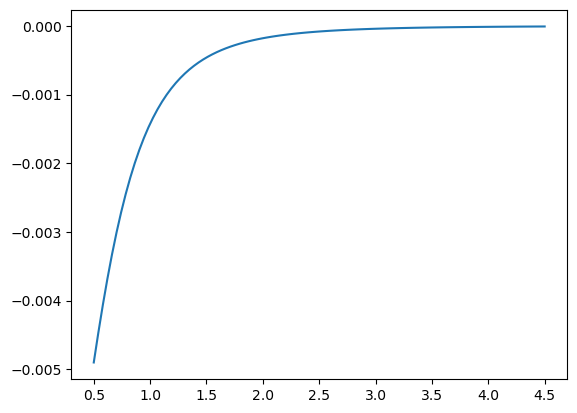

In [35]:
q = kappa * [-1, 0]
rs = 1
kappa = 1
shells = 3
V = [[1, 0] [0, 0]]
plot_gap_lambda(q, rs, kappa, shells, V)

In [164]:
function mBZ_band_structure_lambda(q, rs, kappa, V, shells)
    lambda_list = range(0, 20, 10^2)
    mBZ_count = num_mBZ(shells)
    symm_energies = Array{Float64}(undef, length(lambda_list), mBZ_count)
    for i in 1:length(lambda_list)
        lambda = lambda_list[i]
        ham = lambda_symm_ham(q, lambda, rs, kappa, V, shells)
        symm_energies[i, :] = real.(eigvals(Hermitian(ham)))
    end
    asymm_energies = Array{Float64}(undef, length(lambda_list), mBZ_count)
    for i in 1:length(lambda_list)
        lambda = lambda_list[i]
        ham = lambda_asymm_ham(q, lambda, rs, kappa, V, shells)
        asymm_energies[i, :] = real.(eigvals(Hermitian(ham)))
    end
    fig = Figure(size=(3300, 1500), fontsize=50)
    ax = Axis(fig[1, 1]; xlabel=L"\lambda", ylabel=L"\epsilon_\text{symm}", title=L" \epsilon_\text{symm} \text{ vs } \lambda")

    index1 = 1
    index2 = 2
    
    lines!(ax, lambda_list, symm_energies[:, index1], label = L"1")
    lines!(ax, lambda_list, symm_energies[:, index2], label = L"2")


    ax1 = Axis(fig[1, 2]; xlabel=L"\lambda", ylabel=L"\epsilon_\text{asymm}", title=L" \epsilon_\text{asymm} \text{ vs } \lambda")
    
    lines!(ax1, lambda_list, asymm_energies[:, index1], label = L"1")
    lines!(ax1, lambda_list, asymm_energies[:, index2], label = L"2")

    fig[1, 3] = Legend(fig, ax1, patchsize = (50, 10), framevisible = true)

    fig
end

mBZ_band_structure_lambda (generic function with 1 method)

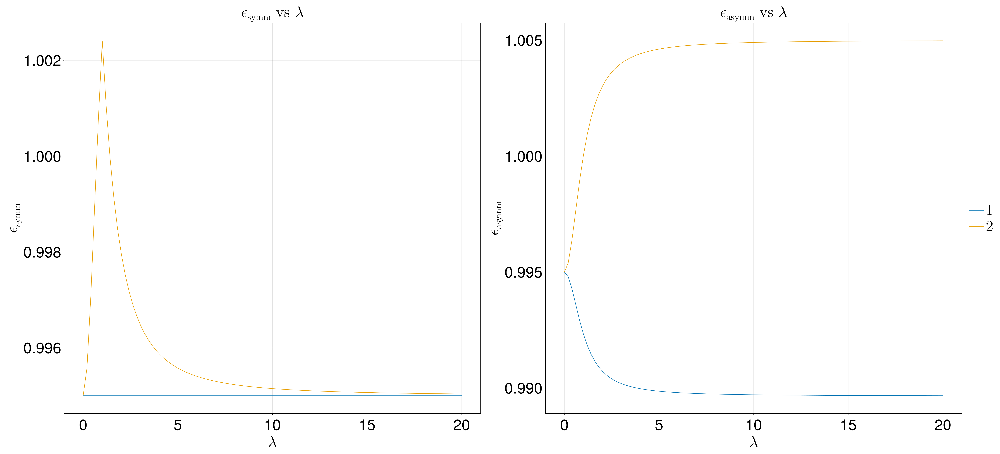

In [167]:
q = kappa * [1, 0]
rs = 1
kappa = 1
V = 0.01
shells = 5
mBZ_band_structure_lambda(q, rs, kappa, V, shells)

# Symmetric moire Berry curvature

In [3]:
function grid_bc(grid, lambda, rs, kappa, V, shells, index, spacing)
    num_vertices = 4
    mom_list = partitions_to_momenta(shells, kappa)

    mBZ_count = num_mBZ(shells)
    partitions = sgn_partitions(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1), 2)
    grounds = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1))
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)

    berry_list = Array{Float64}(undef, size(grid, 1))

    for i in 1:size(grid, 1)
        berry_list[i] = lambda_mBZ_bc!(g1, g2, num_vertices, plaq_area, mom_list, partitions, ham, spinors, grounds, 
        grid[i, :], lambda, rs, kappa, V, shells, index, spacing)
    end
    return berry_list
end

grid_bc (generic function with 1 method)

In [25]:
function symm_grid_bc(grid, lambda, rs, kappa, V, shells, index, spacing)
    num_vertices = 4
    mom_list = partitions_to_momenta(shells, kappa)

    mBZ_count = num_mBZ(shells)
    partitions = sgn_partitions(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1), 2)
    grounds = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1))
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)

    berry_list = Array{Float64}(undef, size(grid, 1))

    for i in 1:size(grid, 1)
        berry_list[i] = lambda_symm_mBZ_bc!(g1, g2, num_vertices, plaq_area, mom_list, partitions, ham, spinors, grounds, 
        grid[i, :], lambda, rs, kappa, V, shells, index, spacing)
    end
    return berry_list
end

symm_grid_bc (generic function with 1 method)

In [26]:
function plot_symm_bc(lambda, rs, kappa, V, shells, index, spacing)
    fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega_\text{symm} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    k_list = range(-2*kappa, 2*kappa, 10^2)
    grid = mesh_grid(k_list, k_list, Float64)

    bc_list = symm_grid_bc(grid, lambda, rs, kappa, V, shells, index, spacing)

    zmax, zmin = maximum(bc_list), minimum(bc_list)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 10)

    tr1 = tricontourf!(ax1, grid[:, 1], grid[:, 2], bc_list, colormap = :RdBu, levels = levels)
    cb1 = Colorbar(fig[1, 2], tr1)

    fig
end

plot_symm_bc (generic function with 1 method)

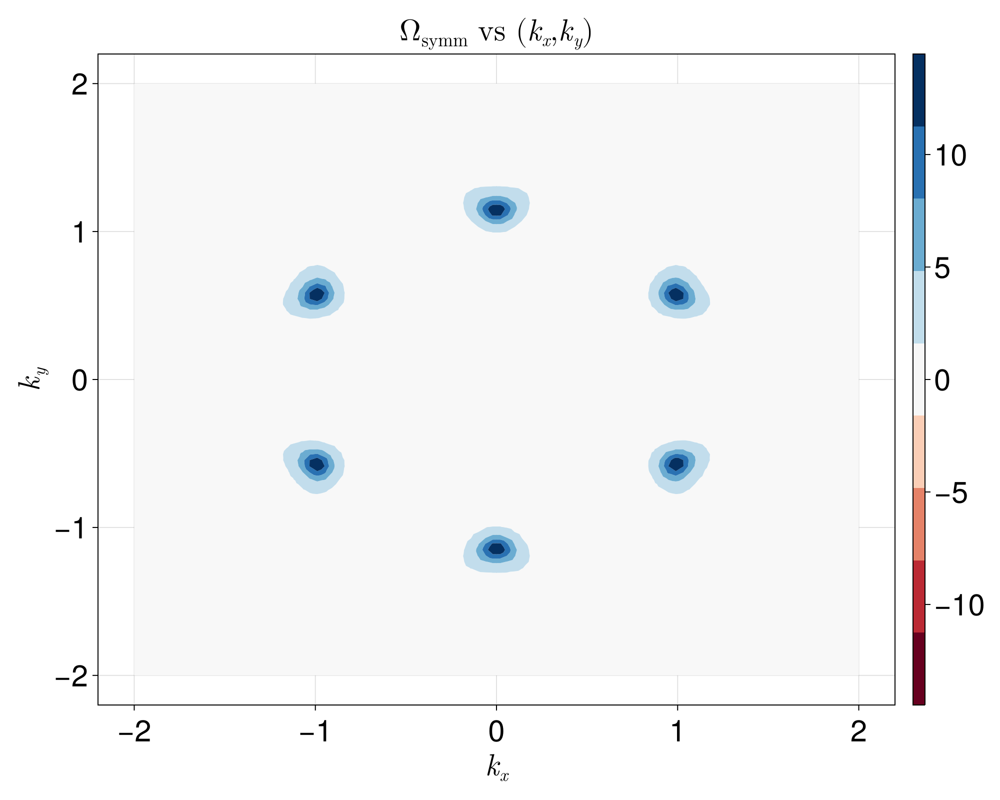

In [89]:
lambda = 2
rs = 10
kappa = 1
V = 0.1
shells = 2
index = 1
spacing = 10^(-1)
plot_symm_bc(lambda, rs, kappa, V, shells, index, spacing)

In [168]:
function symm_comp_lambda(spacing, kappa, V, rs, shells)
    origin = [0.0, 0.0]
    kappa_1 = kappa * [1.0, 0.0]
    q = [0.0, 0.0]
    lambda_list = range(0.5, 2, 10^2)
    full_mBZ_list = Array{Float64}(undef, length(lambda_list))
    patch_list = Array{Float64}(undef, length(lambda_list))

    mBZ_grid = reshape(kappa_1 .+ q, (1, 2))
    patch_grid = reshape(origin .+ q, (1, 2))
    for j in 1:length(lambda_list)
        lambda = lambda_list[j]
        full_mBZ_list[j] = symm_grid_bc(mBZ_grid, lambda, rs, kappa, V, shells, 1, spacing)[1]
        
        delta = V/2 * lambda_delta_symm(kappa, lambda)
        alpha = V/2 * lambda_alpha_symm(kappa, lambda)
        vF = 2 * kappa / rs^2
        patch_list[j] = lambda_patch_bc(patch_grid, spacing, lambda, kappa, vF, delta, alpha)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\lambda", ylabel = L"\Omega", title =  L"\Omega_\text{symm} \text{ vs } \lambda")
    lines!(ax1, lambda_list, full_mBZ_list , label = "mBZ")
    #lines!(ax1, lambda_list, patch_list, label = "patch")

    ax2 = Axis(P[1, 3], xlabel = L"\lambda", ylabel = L"\delta \Omega",  title =  L"\delta \Omega_\text{symm} \text{ vs } \lambda")
    lines!(ax2, lambda_list, abs.((full_mBZ_list - patch_list)./full_mBZ_list))

    P[1, 2] = Legend(P, ax1, patchsize = (50, 10), framevisible = true)
    P
end

symm_comp_lambda (generic function with 1 method)

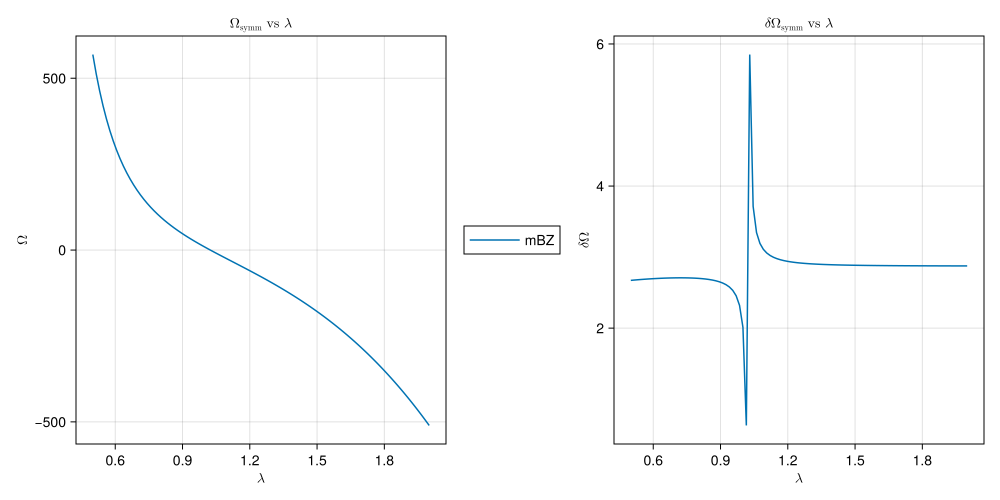

In [173]:
rs = 1
kappa = 1
V = 0.1
shells = 5
spacing = 10^(-4)
symm_comp_lambda(spacing, kappa, V, rs, shells)

In [55]:
function symm_bc_comp(spacing, lambda, rs, kappa, V, shells)
    fig = Figure(size=(3800, 1500), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega^\text{3p}_\text{symm} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")
    ax2 = Axis(fig[1, 3], title = L"\Omega^\text{mBZ}_\text{symm} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")
    ax3 = Axis(fig[1, 5], title = L"\delta \Omega_\text{symm} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    # grid = make_hex([0, 0], kappa, kappa / pd)

    kappa_1 = kappa * [1, 0]

    shift = 0.5 * range(-1, 1, 10^2)

    kx_list = kappa_1[1] * ones(10^2) .+ shift
    ky_list = kappa_1[2] * ones(10^2) .+ shift

    mBZ_grid = mesh_grid(kx_list, ky_list, Float64)

    patch_grid = mesh_grid(shift, shift, Float64)

    delta = V/2 * lambda_delta_symm(kappa, lambda)
    alpha = V/2 * lambda_alpha_symm(kappa, lambda)
    vF = 2 * kappa / rs^2

    patch_bc = lambda_patch_bc(patch_grid, spacing, lambda, kappa, vF, delta, alpha)

    mBZ_bc = symm_grid_bc(mBZ_grid, lambda, rs, kappa, V, shells, 1, spacing)
    
    # patch
    zmax, zmin = maximum(patch_bc), minimum(patch_bc)
    zabs = maximum([abs(zmax), abs(zmin)])
    patch_levels = range(-zabs, zabs, 10)
    tr1 = tricontourf!(ax1, mBZ_grid[:, 1], mBZ_grid[:, 2], patch_bc, colormap = :RdBu, levels = patch_levels)
    cb1 = Colorbar(fig[1, 2], tr1)

   # mBZ
   zmax, zmin = maximum(mBZ_bc), minimum(mBZ_bc)
   zabs = maximum([abs(zmax), abs(zmin)])
   mBZ_levels = range(-zabs, zabs, 10)
   tr1 = tricontourf!(ax2, mBZ_grid[:, 1], mBZ_grid[:, 2], mBZ_bc, colormap = :RdBu, levels = mBZ_levels)
   cb1 = Colorbar(fig[1, 4], tr1)

   # error
   error = abs.((patch_bc .- mBZ_bc))
   tr1 = tricontourf!(ax3, mBZ_grid[:, 1], mBZ_grid[:, 2], error, colormap = :RdBu)
   cb1 = Colorbar(fig[1, 6], tr1)
   
   fig
end

symm_bc_comp (generic function with 1 method)

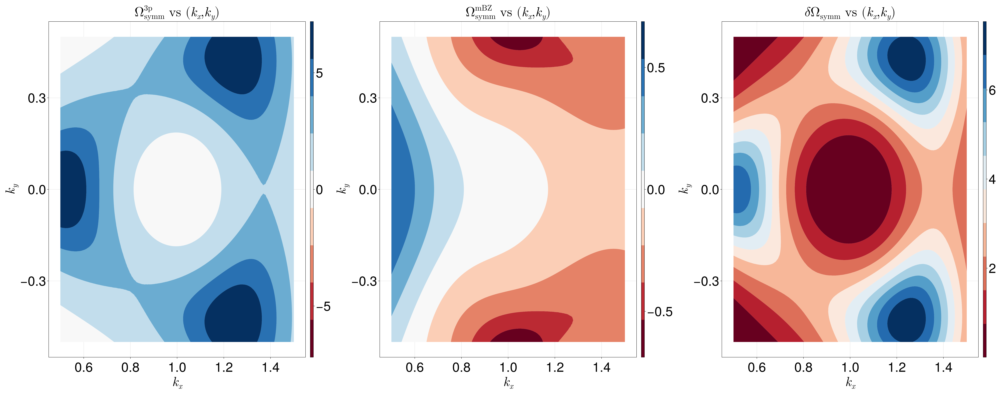

In [57]:
lambda = 3
rs = 10
kappa = 1
V = 0.1
shells = 2
spacing = 10^(-1)
symm_bc_comp(spacing, lambda, rs, kappa, V, shells)

# Symmetric potential Berry curvature convergence

In [116]:
function symm_spacing_conv(k, lambda, rs, kappa, V, shells, index)
    exp_list = range(1, 4, 10^2)
    berry_list = Array{Float64}(undef, length(exp_list))
    point = reshape(k, (1, 2))
    for j in 1:length(exp_list)
        spacing = 10^(-exp_list[j])
        berry_list[j] = symm_grid_bc(point, lambda, rs, kappa, V, shells, index, spacing)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"-\log(\text{spacing})", ylabel = L"\Omega(k_0)", 
    title =  L"\Omega_\text{symm}(k_0) \text{ vs } -\log(\text{spacing})")
    lines!(ax1, exp_list, berry_list)
    P
end

symm_spacing_conv (generic function with 1 method)

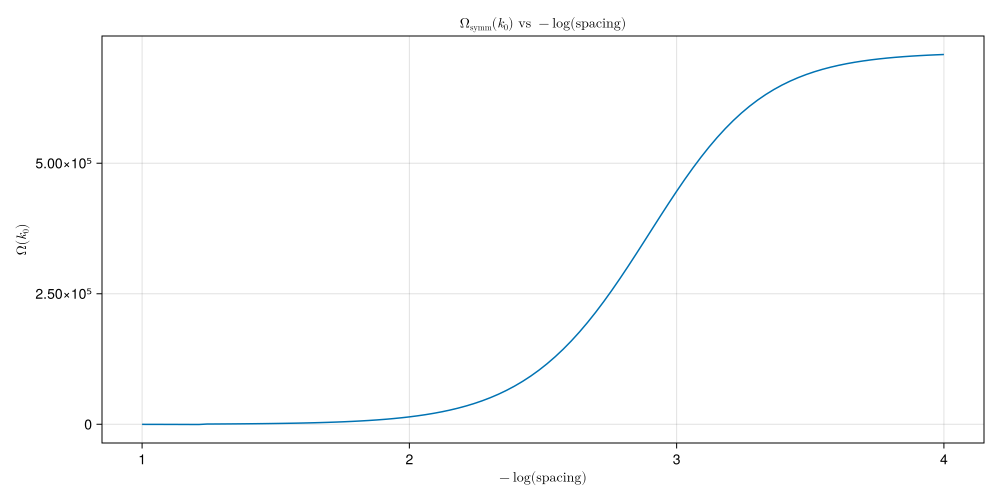

In [177]:
lambda = 1
rs = 1
kappa = 1
V = -0.1
shells = 8
index = 1
k = kappa * [1, 0]
symm_spacing_conv(k, lambda, rs, kappa, V, shells, index)

In [174]:
function symm_shell_conv(k, lambda, rs, kappa, V, index, spacing)
    shell_list = 1:20
    berry_list = Array{Float64}(undef, length(shell_list))
    point = reshape(k, (1, 2))
    for j in 1:length(shell_list)
        shells = shell_list[j]
        berry_list[j] = symm_grid_bc(point, lambda, rs, kappa, V, shells, index, spacing)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\text{shells}", ylabel = L"\Omega(k_0)", title =  L"\Omega_\text{symm}(k_0) \text{ vs } \text{shells}")
    lines!(ax1, shell_list, berry_list)
    P
end

symm_shell_conv (generic function with 1 method)

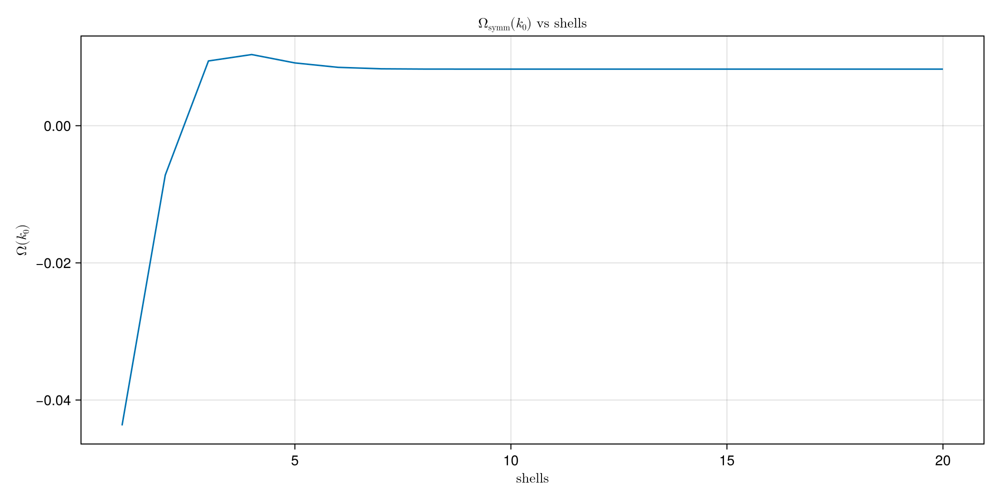

In [175]:
lambda = 1
rs = 1
kappa = 1
V = -100
index = 1
spacing = 10^(-2)
k = kappa * [1, 0]
symm_shell_conv(k, lambda, rs, kappa, V, index, spacing)

In [135]:
# Compute Chern number over a single mBZ
function symm_mBZ_chern(lambda, rs, kappa, V, shells, index, spacing)
    num_vertices = 4
    mom_list = partitions_to_momenta(shells, kappa)

    mBZ_count = num_mBZ(shells)
    partitions = sgn_partitions(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1), 2)
    grounds = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1))
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)
    
    points = make_hex([0, 0], kappa, spacing)
    # points = reshape([1, 0], (1, 2))

    berry = 0

    for i in 1:size(points, 1)
        berry += lambda_symm_mBZ_bc!(g1, g2, num_vertices, plaq_area, mom_list, partitions, ham, spinors, grounds, 
        points[i, :], lambda, rs, kappa, V, shells, index, 10^(-4))
    end
    return 1/(2 * pi) * plaq_area * berry
end

symm_mBZ_chern (generic function with 1 method)

In [40]:
# Compute Chern number over a single mBZ
function mBZ_chern(lambda, rs, kappa, V, shells, index, spacing)
    num_vertices = 4
    mom_list = partitions_to_momenta(shells, kappa)

    mBZ_count = num_mBZ(shells)
    partitions = sgn_partitions(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1), 2)
    grounds = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1))
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)
    
    points = make_hex([0, 0], kappa, spacing)
    # points = reshape([1, 0], (1, 2))

    berry = 0

    for i in 1:size(points, 1)
        berry += lambda_mBZ_bc!(g1, g2, num_vertices, plaq_area, mom_list, partitions, ham, spinors, grounds, 
        points[i, :], lambda, rs, kappa, V, shells, index, 10^(-4))
    end
    return 1/(2 * pi) * plaq_area * berry
end

mBZ_chern (generic function with 1 method)

In [213]:
function plot_chern_lambda(rs, kappa, V, shells, index, spacing)
    lambda_list = range(10^(-5), 5, 10^2)
    chern_list = Array{Float64}(undef, length(lambda_list))
    for j in 1:length(lambda_list)
        lambda = lambda_list[j]
        chern_list[j] = mBZ_chern(lambda, rs, kappa, V, shells, index, spacing)
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\lambda", ylabel = L"C", title =  L"C \text{ vs } \lambda")
    lines!(ax1, lambda_list, chern_list)
    P
end

plot_chern_lambda (generic function with 1 method)

In [138]:
function plot_symm_chern_lambda(rs, kappa, V, shells, index, spacing)
    lambda_list = range(10^(-5), 5, 10^2)
    chern_list = Array{Float64}(undef, length(lambda_list))
    for j in 1:length(lambda_list)
        lambda = lambda_list[j]
        chern_list[j] = symm_mBZ_chern(lambda, rs, kappa, V, shells, index, spacing)
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\lambda", ylabel = L"C", title =  L"C \text{ vs } \lambda")
    lines!(ax1, lambda_list, chern_list)
    P
end

plot_symm_chern_lambda (generic function with 1 method)

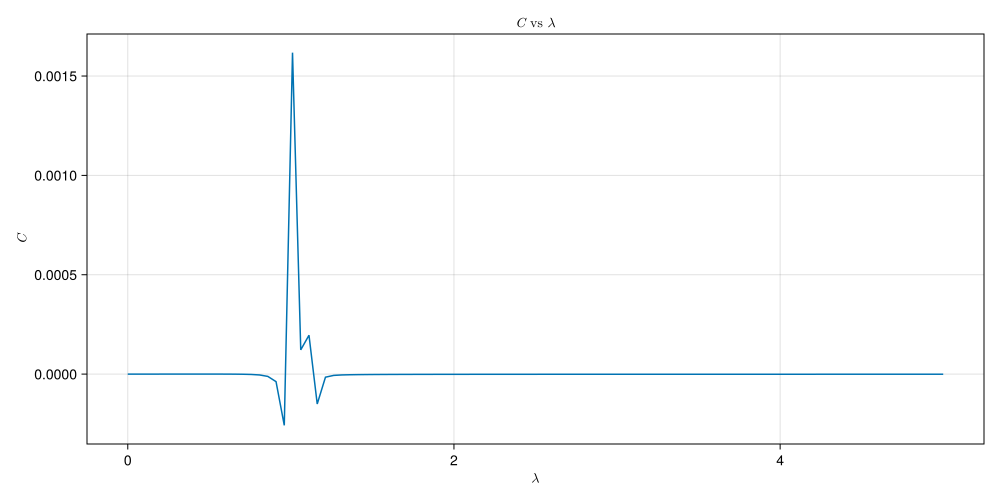

In [176]:
rs = 1
kappa = 1
V = -0.1
shells = 3
index = 1
spacing = 10^(-1)
plot_symm_chern_lambda(rs, kappa, V, shells, index, spacing)

In [83]:
lambda = 0.0000001
rs = 1
kappa = 1
V = 0.1
shells = 9
index = 1
spacing = 10^(-1)
symm_mBZ_chern(lambda, rs, kappa, V, shells, index, spacing)

-1.1645703933661914e-15

# Symmetric sampling diagnostic

In [85]:
function symm_sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)
    fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega_\text{symm} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    k_list = range(-kappa, kappa, 10^2)
    grid = mesh_grid(k_list, k_list, Float64)

    points = make_hex([0, 0], kappa, spacing)

    bc_list = symm_grid_bc(grid, lambda, rs, kappa, V, shells, index, spacing)

    zmax, zmin = maximum(bc_list), minimum(bc_list)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 10)

    tr1 = tricontourf!(ax1, grid[:, 1], grid[:, 2], bc_list, colormap = :RdBu, levels = levels)
    cb1 = Colorbar(fig[1, 2], tr1)

    scatter!(ax1, points[:, 1], points[:, 2], color = :green)

    fig
end

symm_sample_diagnostic (generic function with 1 method)

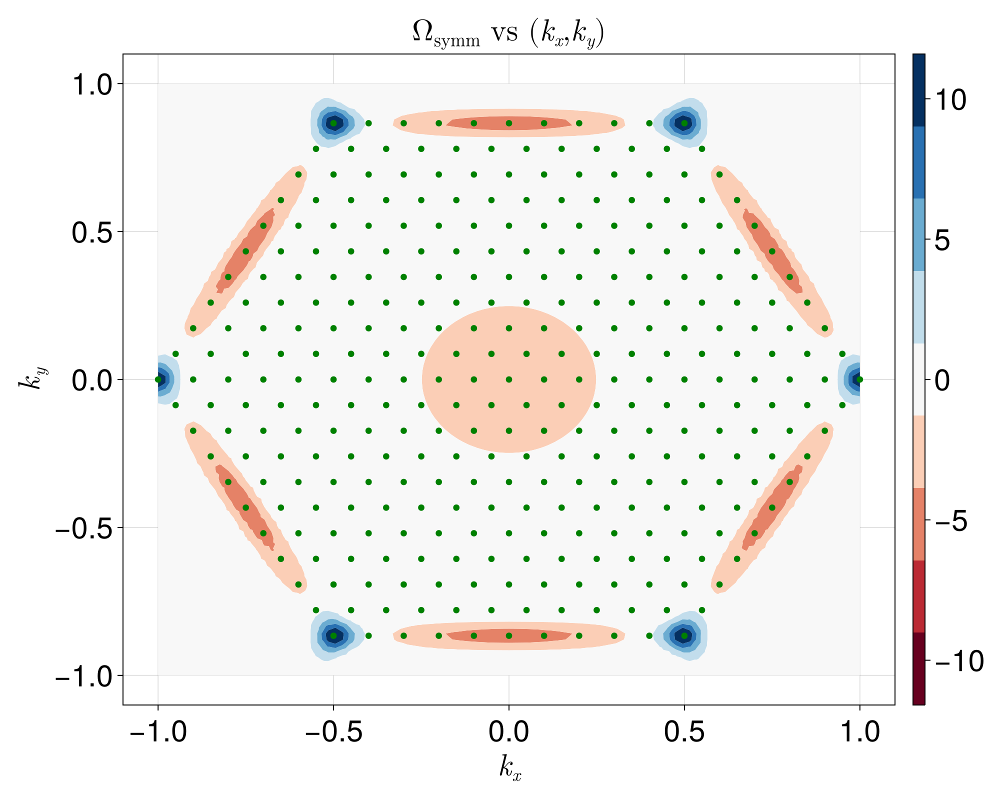

In [178]:
lambda = 2
rs = 1
kappa = 1
V = -0.1
shells = 3
index = 1
spacing = 10^(-1)
symm_sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)

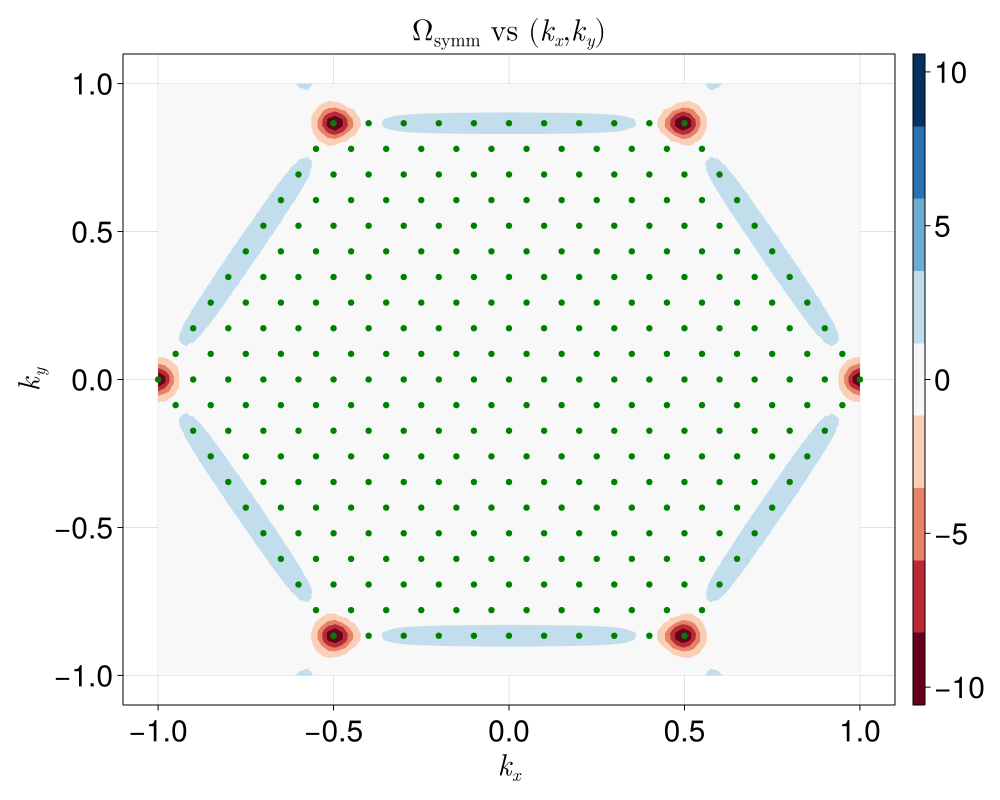

In [179]:
lambda = 0.5
rs = 1
kappa = 1
V = -0.1
shells = 3
index = 1
spacing = 10^(-1)
symm_sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)

# Anti-Symmetric energies

In [89]:
function asymm_plot_gaps(rs, kappa, shells)
    fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\epsilon_\text{gap} \text{ vs } (\lambda, V)", xlabel = L"\lambda", ylabel = L"V")
    lambda_list = range(0, 3, 10^2)
    V_list = range(-0.001, -1, 10^2)
    grid = mesh_grid(lambda_list, V_list, Float64)
    mBZ_count = num_mBZ(shells)
    gaps = []

    for i in 1:length(lambda_list)
        lambda = lambda_list[i]
        for j in 1:length(V_list)
            V = V_list[j]
            ham = lambda_asymm_ham(kappa * [1, 0], lambda, rs, kappa, V, shells)
            push!(gaps, real.(eigvals(Hermitian(ham))[1] - eigvals(Hermitian(ham))[2]))
        end
    end

    zmax, zmin = maximum(gaps), minimum(gaps)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 10)

    tr1 = tricontourf!(ax1, grid[:, 1], grid[:, 2], log10.(abs.(gaps)), colormap = :RdBu)
    cb1 = Colorbar(fig[1, 2], tr1)

    fig
end

asymm_plot_gaps (generic function with 1 method)

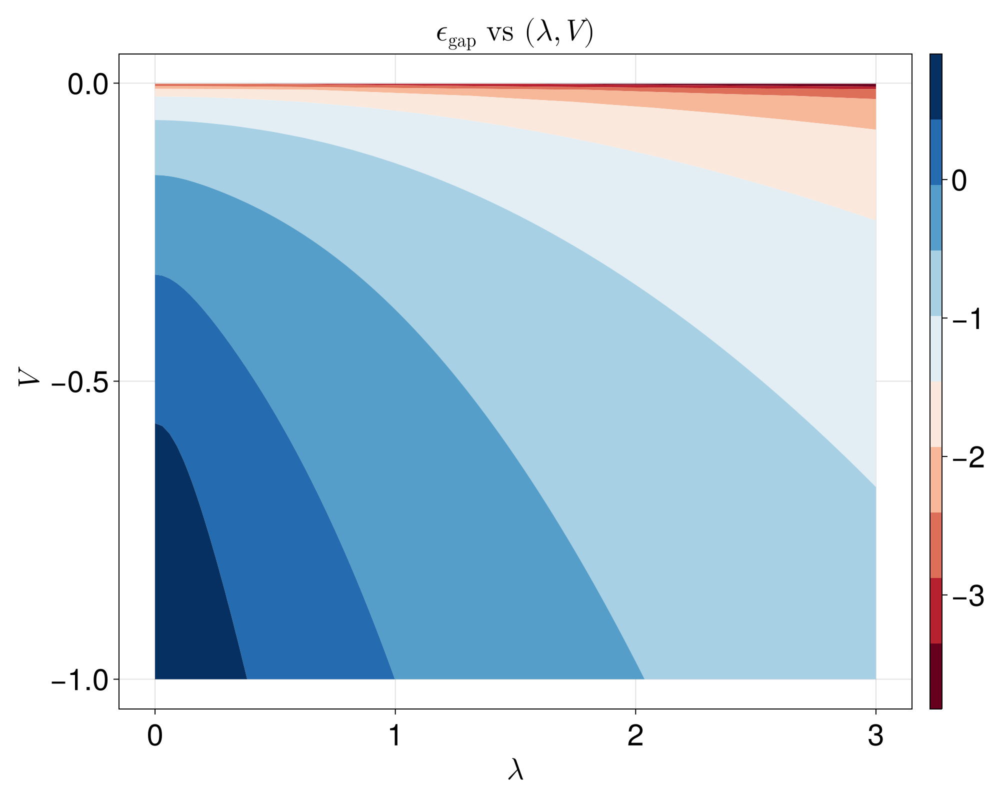

In [559]:
rs = 1
kappa = 1
shells = 3
asymm_plot_gaps(rs, kappa, shells)

In [90]:
function plot_asymm_gap_shells(q, lambda, rs, kappa, V)
    shell_list = 1:40
    gaps = Array{Float64}(undef, length(shell_list))
    for i in 1:length(shell_list)
        shells = shell_list[i]
        ham = lambda_asymm_ham(q, lambda, rs, kappa, V, shells)
        vals = eigvals(Hermitian(ham))
        gaps[i] = real.(vals[1] - vals[2])
    end
    
    fig = Figure(size=(3300, 1500), fontsize=50)
    ax = Axis(fig[1, 1]; xlabel=L"\text{shells}", ylabel=L"\epsilon_\text{gap}", title=L" \epsilon_\text{gap} \text{ vs } \text{shells}")

    lines!(ax, shell_list, gaps)

    fig
end

plot_asymm_gap_shells (generic function with 1 method)

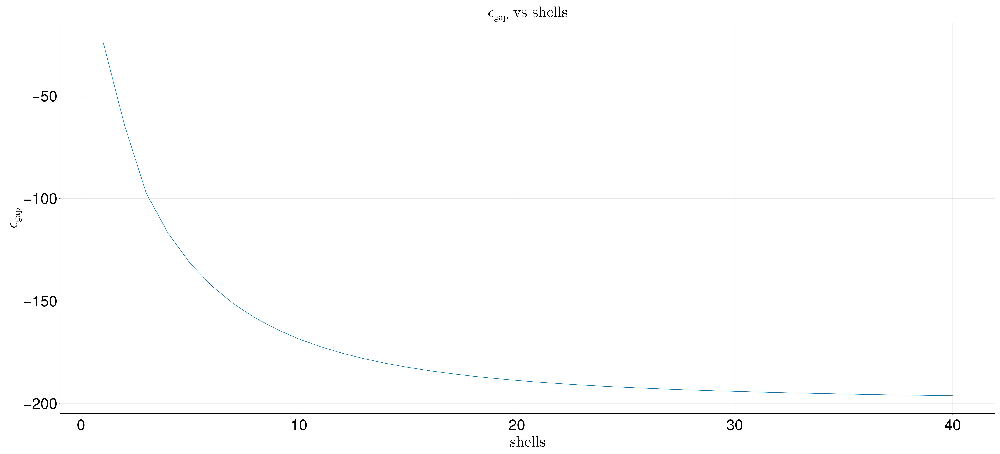

In [19]:
q = kappa * [1, 0]
lambda = 0.5
rs = 1
kappa = 1
V = -20
plot_asymm_gap_shells(q, lambda, rs, kappa, V)

# Anti-Symmetric Moire Berry Curvature

In [91]:
function asymm_grid_bc(grid, lambda, rs, kappa, V, shells, index, spacing)
    num_vertices = 4
    mom_list = partitions_to_momenta(shells, kappa)

    mBZ_count = num_mBZ(shells)
    partitions = sgn_partitions(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1), 2)
    grounds = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1))
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)

    berry_list = Array{Float64}(undef, size(grid, 1))

    for i in 1:size(grid, 1)
        berry_list[i] = lambda_asymm_mBZ_bc!(g1, g2, num_vertices, plaq_area, mom_list, partitions, ham, spinors, grounds, 
        grid[i, :], lambda, rs, kappa, V, shells, index, spacing)
    end
    return berry_list
end

asymm_grid_bc (generic function with 1 method)

In [92]:
function plot_asymm_bc(lambda, rs, kappa, V, shells, index, spacing)
    fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega_\text{asymm} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    k_list = range(-2*kappa, 2*kappa, 10^2)
    grid = mesh_grid(k_list, k_list, Float64)

    bc_list = asymm_grid_bc(grid, lambda, rs, kappa, V, shells, index, spacing)

    zmax, zmin = maximum(bc_list), minimum(bc_list)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 10)

    tr1 = tricontourf!(ax1, grid[:, 1], grid[:, 2], bc_list, colormap = :RdBu, levels = levels)
    cb1 = Colorbar(fig[1, 2], tr1)

    fig
end

plot_asymm_bc (generic function with 1 method)

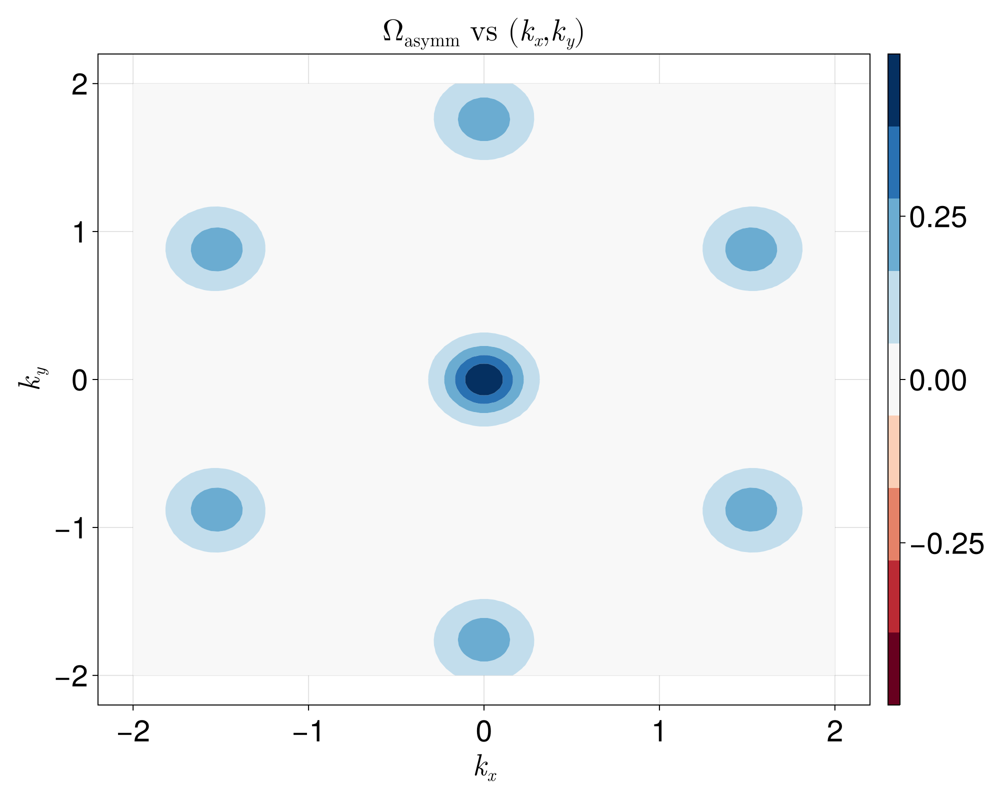

In [190]:
lambda = 2
rs = 10
kappa = 1
V = 0.1
shells = 2
index = 1
spacing = 10^(-1)
plot_asymm_bc(lambda, rs, kappa, V, shells, index, spacing)

In [126]:
function asymm_comp_lambda(spacing, kappa, V, rs, shells)
    origin = [0.0, 0.0]
    kappa_1 = kappa * [1.0, 0.0]
    q = [0.0, 0.0]
    lambda_list = range(0.01, 5, 10^2)
    full_mBZ_list = Array{Float64}(undef, length(lambda_list))
    patch_list = Array{Float64}(undef, length(lambda_list))

    mBZ_grid = reshape(kappa_1 .+ q, (1, 2))
    patch_grid = reshape(origin .+ q, (1, 2))
    for j in 1:length(lambda_list)
        lambda = lambda_list[j]
        full_mBZ_list[j] = asymm_grid_bc(mBZ_grid, lambda, rs, kappa, V, shells, 1, spacing)[1]
        
        delta = V/2 * lambda_delta_asymm(kappa, lambda)
        alpha = V/2 * lambda_alpha_asymm(kappa, lambda)
        vF = 2 * kappa / rs^2
        patch_list[j] = lambda_patch_bc(patch_grid, spacing, lambda, kappa, vF, delta, alpha)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\lambda", ylabel = L"\Omega", title =  L"\Omega_\text{asymm} \text{ vs } \lambda")
    lines!(ax1, lambda_list, full_mBZ_list , label = "mBZ")
    lines!(ax1, lambda_list, patch_list, label = "patch")

    ax2 = Axis(P[1, 3], xlabel = L"\lambda", ylabel = L"\delta \Omega",  title =  L"\delta \Omega_\text{asymm} \text{ vs } \lambda")
    lines!(ax2, lambda_list, abs.((full_mBZ_list - patch_list)./full_mBZ_list))

    P[1, 2] = Legend(P, ax1, patchsize = (50, 10), framevisible = true)
    P
end

asymm_comp_lambda (generic function with 1 method)

In [247]:
function comp_lambda(spacing, kappa, V, rs, shells)
    origin = [0.0, 0.0]
    kappa_1 = kappa * [1.0, 0.0]
    q = [0.0, 0.0]
    lambda_list = range(0.01, 5, 10^2)
    full_mBZ_list = Array{Float64}(undef, length(lambda_list))
    patch_list = Array{Float64}(undef, length(lambda_list))

    mBZ_grid = reshape(kappa_1 .+ q, (1, 2))
    patch_grid = reshape(origin .+ q, (1, 2))
    for j in 1:length(lambda_list)
        lambda = lambda_list[j]
        full_mBZ_list[j] = grid_bc(mBZ_grid, lambda, rs, kappa, V, shells, 1, spacing)[1]
        
        # delta = V/2 * lambda_delta_asymm(kappa, lambda)
        # alpha = V/2 * lambda_alpha_asymm(kappa, lambda)
        # vF = 2 * kappa / rs^2
        # patch_list[j] = lambda_patch_bc(patch_grid, spacing, lambda, kappa, vF, delta, alpha)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\lambda", ylabel = L"\Omega", title =  L"\Omega_\text{asymm} \text{ vs } \lambda")
    lines!(ax1, lambda_list, full_mBZ_list , label = "mBZ")
    # lines!(ax1, lambda_list, patch_list, label = "patch")

    # ax2 = Axis(P[1, 3], xlabel = L"\lambda", ylabel = L"\delta \Omega",  title =  L"\delta \Omega_\text{asymm} \text{ vs } \lambda")
    # lines!(ax2, lambda_list, abs.((full_mBZ_list - patch_list)./full_mBZ_list))

    P[1, 2] = Legend(P, ax1, patchsize = (50, 10), framevisible = true)
    P
end

comp_lambda (generic function with 1 method)

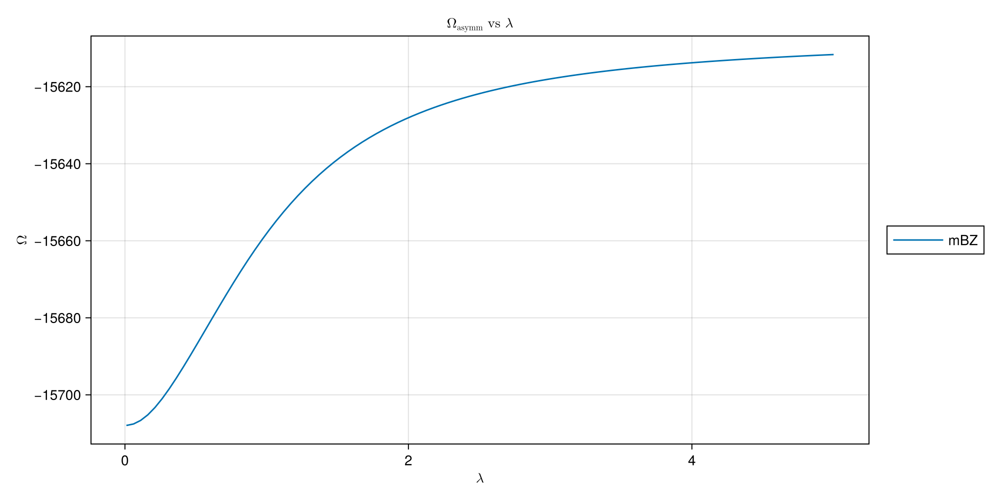

In [251]:
rs = 1
kappa = 1
V = [[1, 0] [0, 0]]
shells = 3
spacing = 10^(-2)
comp_lambda(spacing, kappa, V, rs, shells)

In [95]:
function asymm_bc_comp(spacing, lambda, rs, kappa, V, shells)
    fig = Figure(size=(3800, 1500), fontsize=50, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega^\text{3p}_\text{asymm} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")
    ax2 = Axis(fig[1, 3], title = L"\Omega^\text{mBZ}_\text{asymm} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")
    ax3 = Axis(fig[1, 5], title = L"\delta \Omega_\text{asymm} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    # grid = make_hex([0, 0], kappa, kappa / pd)

    kappa_1 = kappa * [1, 0]

    shift = 0.5 * range(-1, 1, 10^2)

    kx_list = kappa_1[1] * ones(10^2) .+ shift
    ky_list = kappa_1[2] * ones(10^2) .+ shift

    mBZ_grid = mesh_grid(kx_list, ky_list, Float64)

    patch_grid = mesh_grid(shift, shift, Float64)

    delta = V/2 * lambda_delta_asymm(kappa, lambda)
    alpha = V/2 * lambda_alpha_asymm(kappa, lambda)
    vF = 2 * kappa / rs^2

    patch_bc = lambda_patch_bc(patch_grid, spacing, lambda, kappa, vF, delta, alpha)

    mBZ_bc = asymm_grid_bc(mBZ_grid, lambda, rs, kappa, V, shells, 1, spacing)
    
    # patch
    zmax, zmin = maximum(patch_bc), minimum(patch_bc)
    zabs = maximum([abs(zmax), abs(zmin)])
    patch_levels = range(-zabs, zabs, 10)
    tr1 = tricontourf!(ax1, mBZ_grid[:, 1], mBZ_grid[:, 2], patch_bc, colormap = :RdBu, levels = patch_levels)
    cb1 = Colorbar(fig[1, 2], tr1)

   # mBZ
   zmax, zmin = maximum(mBZ_bc), minimum(mBZ_bc)
   zabs = maximum([abs(zmax), abs(zmin)])
   mBZ_levels = range(-zabs, zabs, 10)
   tr1 = tricontourf!(ax2, mBZ_grid[:, 1], mBZ_grid[:, 2], mBZ_bc, colormap = :RdBu, levels = mBZ_levels)
   cb1 = Colorbar(fig[1, 4], tr1)

   # error
   error = abs.((patch_bc .- mBZ_bc))
   tr1 = tricontourf!(ax3, mBZ_grid[:, 1], mBZ_grid[:, 2], error, colormap = :RdBu)
   cb1 = Colorbar(fig[1, 6], tr1)
   
   fig
end

asymm_bc_comp (generic function with 1 method)

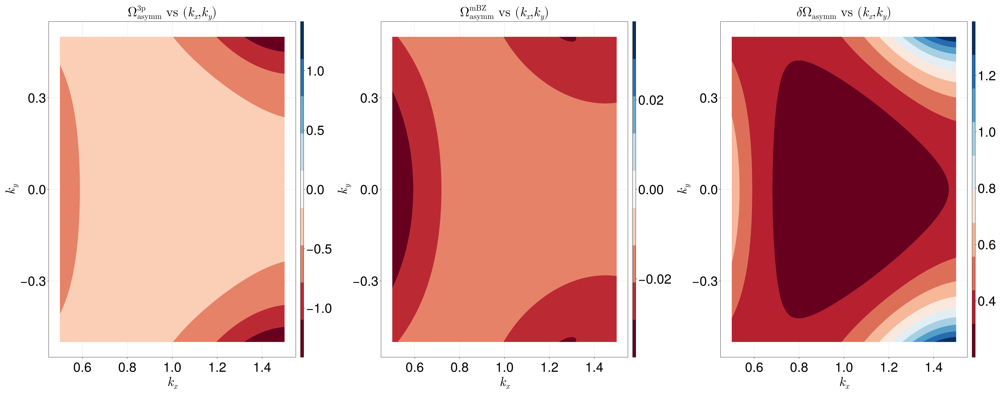

In [196]:
lambda = 3
rs = 10
kappa = 1
V = 0.1
shells = 2
spacing = 10^(-1)
asymm_bc_comp(spacing, lambda, rs, kappa, V, shells)

# Anti-Symmetric potential Berry curvature convergence

In [267]:
function spacing_conv(k, lambda1, lambda2, rs, kappa, V, shells, index)
    exp_list = range(-2, 4, 10^2)
    berry_list = Array{Float64}(undef, length(exp_list))
    point = reshape(k, (1, 2))
    for j in 1:length(exp_list)
        spacing = 10^(-exp_list[j])
        berry_list[j] = (grid_bc(point, lambda1, rs, kappa, V, shells, index, spacing)[1] - 
        grid_bc(point, lambda2, rs, kappa, V, shells, index, spacing)[1])
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"-\log(\text{spacing})", ylabel = L"\Omega(k_0)", 
    title =  L"\Omega_\text{asymm}(k_0) \text{ vs } -\log(\text{spacing})")
    lines!(ax1, exp_list, berry_list)
    P
end

spacing_conv (generic function with 2 methods)

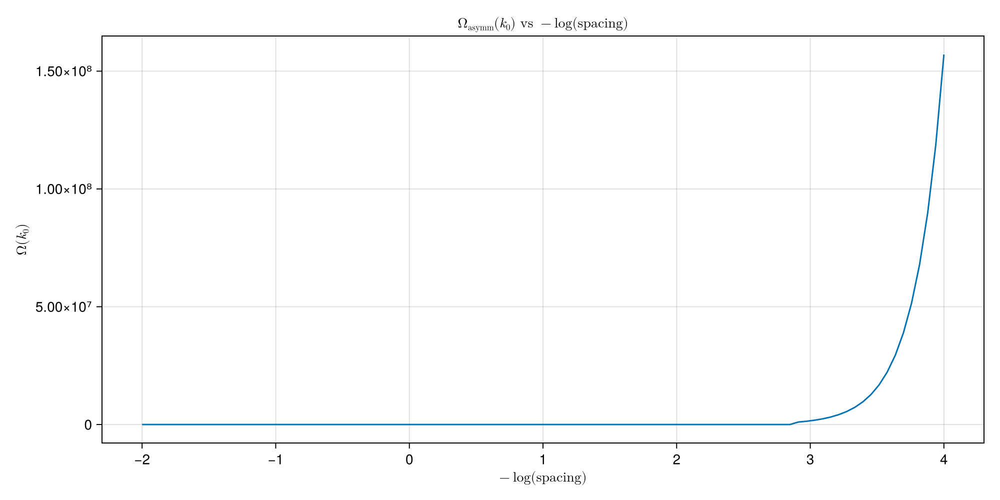

In [268]:
lambda1= 1
lambda2 = 3
rs = 1
kappa = 1
V = [[1, 0] [0, 0]]
shells = 3
index = 1
k = kappa * [1, 0]
spacing_conv(k, lambda1, lambda2, rs, kappa, V, shells, index)

In [11]:
function sample_diagnostic_v2(lambda1, lambda2, rs, kappa, V, shells, index, spacing)
    # fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    # ax1 = Axis(fig[1, 1], title = L"\Omega \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    k_list = range(-kappa, kappa, 10^2)
    kx_list = range(kappa - 0.2, kappa + 0.2, 10^2)
    ky_list = range(-0.2, 0.2, 10^2)
    grid = mesh_grid(k_list, k_list, Float64)

    points = make_hex([0, 0], kappa, spacing)

    bc_list = grid_bc(grid, lambda1, rs, kappa, V, shells, index, spacing) .- grid_bc(grid, lambda2, rs, kappa, V, shells, index, spacing)

    zmax, zmin = maximum(bc_list), minimum(bc_list)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 1000)

    return grid, bc_list

    # tr1 = contourf!(ax1, grid[:, 1], grid[:, 2], bc_list, colormap = :RdBu, levels = levels)
    # cb1 = Colorbar(fig[1, 2], tr1)


    # scatter!(ax1, points[:, 1], points[:, 2], color = :green)

    # fig
end

sample_diagnostic_v2 (generic function with 1 method)

In [51]:
lambda1= 2.32
lambda2 = 2.33
rs = 1
kappa = 1
V = [[1, 0] [0, 0]]
shells = 3
index = 1
k = kappa * [1, 0]
spacing = 10^(-3)
# sample_diagnostic_v2(lambda1, lambda2, rs, kappa, V, shells, index, spacing)
grid, bc_list = sample_diagnostic_v2(lambda1, lambda2, rs, kappa, V, shells, index, spacing)

([-1.0 -1.0; -1.0 -0.9797979797979798; … ; 1.0 0.9797979797979798; 1.0 1.0], [-0.0004952214261498833, -0.00048432136437220885, -0.00047357764942684843, -0.000463801037181244, -0.0004557018195412432, -0.00044985660314061926, -0.00044667981309226557, -0.000446402709611049, -0.0004490616746187781, -0.00045449698117461246  …  -0.0004544969810120203, -0.00044906167478137027, -0.00044640270971940677, -0.00044667981303803117, -0.00044985660265273175, -0.00045570181992077297, -0.0004638010375606627, -0.00047357764915573197, -0.00048432136437220885, -0.0004952214260415255])

In [52]:
grid_new = reshape(grid, (100, 100, 2))
bc_list_new = reshape(bc_list, (100, 100))

100×100 Matrix{Float64}:
 -0.000495221  -0.000540962  -0.000561127  …  -0.000540962  -0.000495222
 -0.000484321  -0.000538951  -0.000566994     -0.000538951  -0.000484321
 -0.000473578  -0.000535988  -0.000570851     -0.000535988  -0.000473578
 -0.000463801  -0.000532728  -0.000573255     -0.000532728  -0.000463801
 -0.000455702  -0.00052974   -0.000574681     -0.00052974   -0.000455702
 -0.000449857  -0.000527481  -0.000575512  …  -0.000527481  -0.000449857
 -0.00044668   -0.000526281  -0.000576018     -0.000526281  -0.00044668
 -0.000446403  -0.000526326  -0.000576356     -0.000526326  -0.000446403
 -0.000449062  -0.000527647  -0.000576557     -0.000527647  -0.000449062
 -0.000454497  -0.000530124  -0.000576528     -0.000530124  -0.000454497
  ⋮                                        ⋱                
 -0.000449062  -0.000527647  -0.000576557     -0.000527647  -0.000449062
 -0.000446403  -0.000526326  -0.000576356     -0.000526326  -0.000446403
 -0.00044668   -0.000526281  -0.0005760

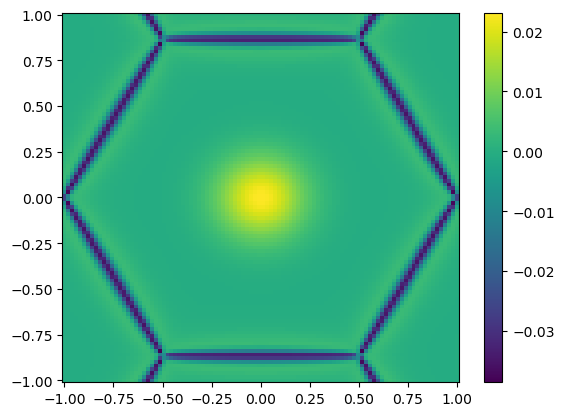

In [53]:
figure()
pcolormesh(grid_new[:, :, 1], grid_new[:, :, 2], bc_list_new)
colorbar()
display(gcf())

In [193]:
function asymm_shell_conv(k, lambda, rs, kappa, V, index, spacing)
    shell_list = 1:10
    berry_list = Array{Float64}(undef, length(shell_list))
    point = reshape(k, (1, 2))
    for j in 1:length(shell_list)
        shells = shell_list[j]
        berry_list[j] = asymm_grid_bc(point, lambda, rs, kappa, V, shells, index, spacing)[1]
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\text{shells}", ylabel = L"\Omega(k_0)", title =  L"\Omega_\text{asymm}(k_0) \text{ vs } \text{shells}")
    lines!(ax1, shell_list, berry_list)
    P
end

asymm_shell_conv (generic function with 1 method)

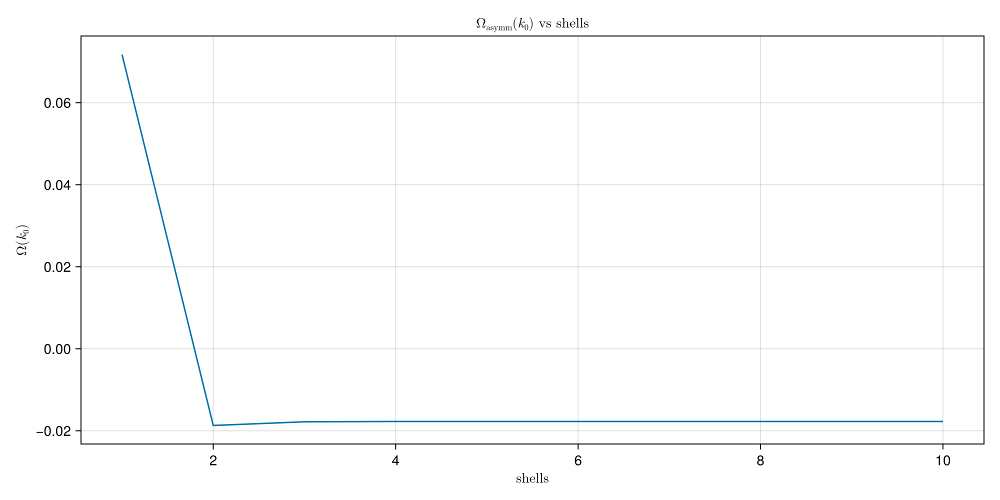

In [194]:
lambda = 5
rs = 10
kappa = 1
V = -0.1
index = 1
spacing = 10^(-2)
k = kappa * [1, 0]
asymm_shell_conv(k, lambda, rs, kappa, V, index, spacing)

In [129]:
# Compute Chern number over a single mBZ
function asymm_mBZ_chern(lambda, rs, kappa, V, shells, index, spacing)
    num_vertices = 4
    mom_list = partitions_to_momenta(shells, kappa)

    mBZ_count = num_mBZ(shells)
    partitions = sgn_partitions(shells)
    ham = zeros(ComplexF64, mBZ_count, mBZ_count)
    spinors = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1), 2)
    grounds = Array{ComplexF64}(undef, num_vertices, size(mom_list, 1))
    plaq_area = area(spacing * sqrt(2), num_vertices)

    g1 = kappa * sqrt(3) * [-sqrt(3)/2, 1/2]
    g2 = kappa * sqrt(3) * [0, 1]

    gi = zeros(2)
    gj = zeros(2)
    
    points = make_hex([0, 0], kappa, spacing)
    # points = reshape([1, 0], (1, 2))

    berry = 0

    for i in 1:size(points, 1)
        berry += lambda_asymm_mBZ_bc!(g1, g2, num_vertices, plaq_area, mom_list, partitions, ham, spinors, grounds, 
        points[i, :], lambda, rs, kappa, V, shells, index, 10^(-4))
    end
    return 1/(2 * pi) * plaq_area * berry
end

asymm_mBZ_chern (generic function with 1 method)

In [184]:
function plot_asymm_chern_lambda(rs, kappa, V, shells, index, spacing)
    lambda_list = range(10^(-5), 5, 10^2)
    chern_list = Array{Float64}(undef, length(lambda_list))
    for j in 1:length(lambda_list)
        lambda = lambda_list[j]
        chern_list[j] = asymm_mBZ_chern(lambda, rs, kappa, V, shells, index, spacing)
    end
    P = Figure(size=(1000, 500))
    ax1 = Axis(P[1, 1], xlabel = L"\lambda", ylabel = L"C", title =  L"C \text{ vs } \lambda")
    lines!(ax1, lambda_list, chern_list)
    P
end

plot_asymm_chern_lambda (generic function with 1 method)

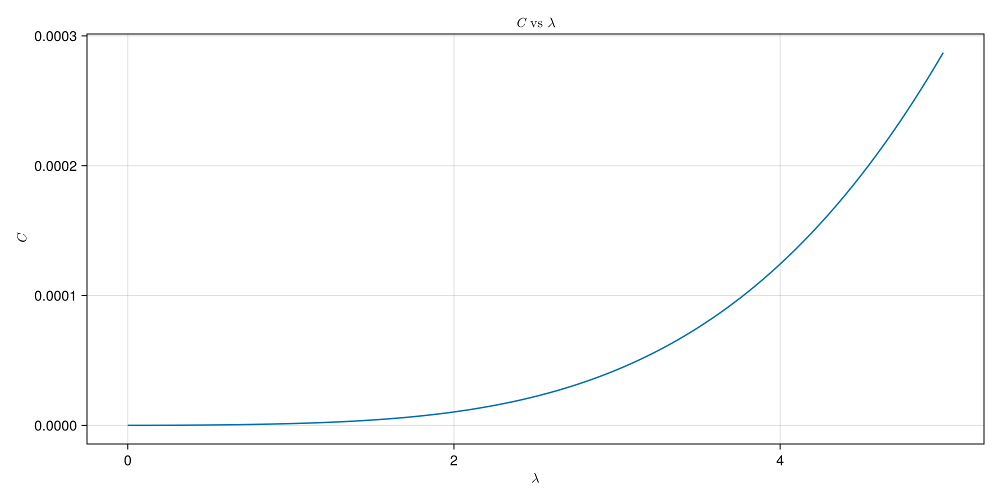

In [185]:
rs = 1
kappa = 1
V = -0.1
shells = 3
index = 1
spacing = 10^(-1)
plot_asymm_chern_lambda(rs, kappa, V, shells, index, spacing)

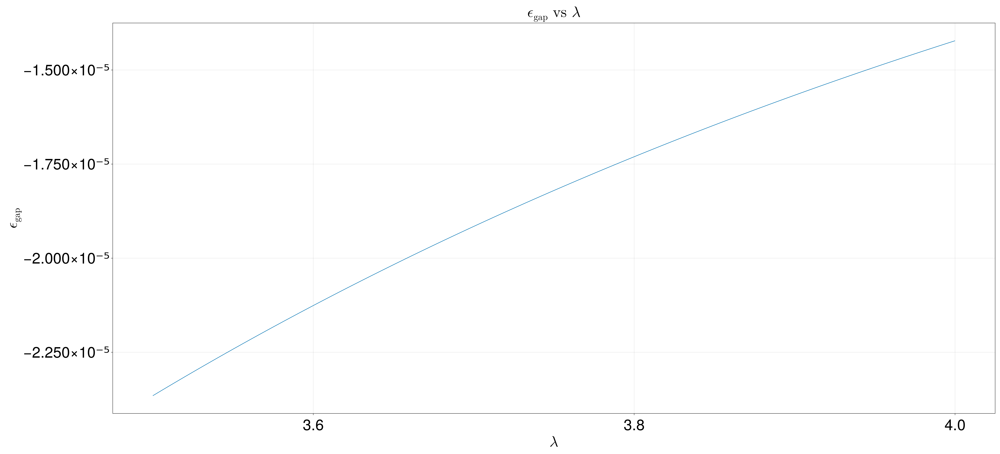

In [238]:
q = kappa * [1, 0]
rs = 1
kappa = 1
shells = 3
V = [[1, 0] [0, 0]]
plot_symm_gap_lambda(q, rs, kappa, shells, V)

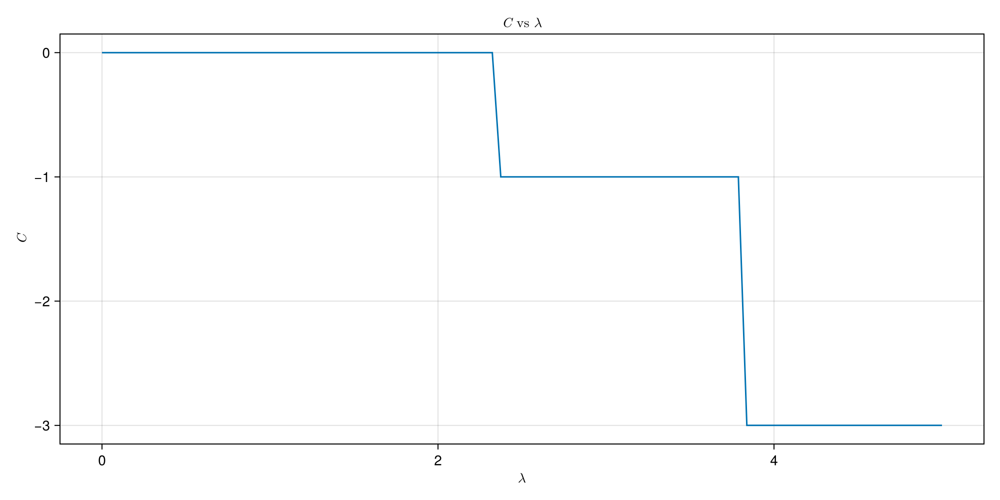

In [215]:
rs = 1
kappa = 1
V = [[1, 0] [0, 0]]
shells = 3
index = 1
spacing = 10^(-1)
plot_chern_lambda(rs, kappa, V, shells, index, spacing)

In [235]:
rs = 1
kappa = 1
V = [[-1, 0] [0, 0]]
shells = 3
index = 1
spacing = 10^(-1)
plot_chern_lambda(rs, kappa, V, shells, index, spacing)

InterruptException: InterruptException:

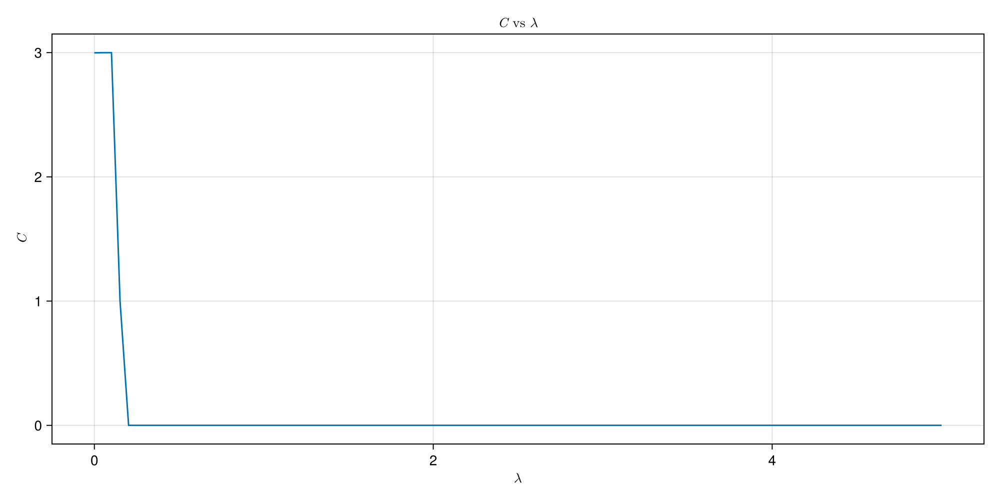

In [218]:
rs = 1
kappa = 1
V = [[0, 0] [0, 1]]
shells = 3
index = 1
spacing = 10^(-1)
plot_chern_lambda(rs, kappa, V, shells, index, spacing)

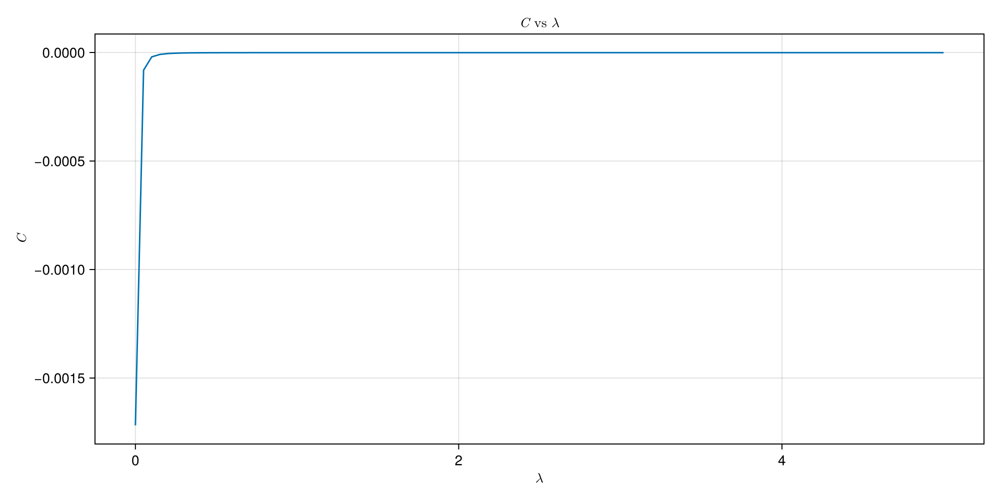

In [219]:
rs = 1
kappa = 1
V = [[0, 0] [0, -1]]
shells = 3
index = 1
spacing = 10^(-1)
plot_chern_lambda(rs, kappa, V, shells, index, spacing)

In [50]:
rs = 1
kappa = 1
lambda = 2.33
V = [[1, 0] [0, 0]]
shells = 3
index = 1
spacing = 10^(-1)
mBZ_chern(lambda, rs, kappa, V, shells, index, spacing)

-0.9999304005160881

In [133]:
lambda = 10000
rs = 1
kappa = 1
V = -0.1
shells = 3
index = 1
spacing = 10^(-1)
asymm_mBZ_chern(lambda, rs, kappa, V, shells, index, spacing)

2.8437657206920854

# Anti-Symmetric sampling diagnostic

In [181]:
function asymm_sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)
    fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega_\text{asymm} \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    k_list = range(-kappa, kappa, 10^2)
    grid = mesh_grid(k_list, k_list, Float64)

    points = make_hex([0, 0], kappa, spacing)

    bc_list = asymm_grid_bc(grid, lambda, rs, kappa, V, shells, index, spacing)

    zmax, zmin = maximum(bc_list), minimum(bc_list)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 10)

    tr1 = tricontourf!(ax1, grid[:, 1], grid[:, 2], bc_list, colormap = :RdBu, levels = levels)
    cb1 = Colorbar(fig[1, 2], tr1)

    scatter!(ax1, points[:, 1], points[:, 2], color = :green)

    fig
end

asymm_sample_diagnostic (generic function with 1 method)

In [242]:
function sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)
    fig = Figure(size=(1000, 800), fontsize=30, fonts = (; regular = "italic", weird = "bold"))
    ax1 = Axis(fig[1, 1], title = L"\Omega \text{ vs } (k_x, k_y)", xlabel = L"k_x", ylabel = L"k_y")

    k_list = range(-kappa, kappa, 10^2)
    kx_list = range(kappa - 0.2, kappa + 0.2, 10^2)
    ky_list = range(-0.2, 0.2, 10^2)
    grid = mesh_grid(kx_list, ky_list, Float64)

    points = make_hex([0, 0], kappa, spacing)

    bc_list = grid_bc(grid, lambda, rs, kappa, V, shells, index, spacing)

    zmax, zmin = maximum(bc_list), minimum(bc_list)

    zabs = maximum([abs(zmax), abs(zmin)])

    levels = range(-zabs, zabs, 10)

    tr1 = tricontourf!(ax1, grid[:, 1], grid[:, 2], bc_list, colormap = :RdBu, levels = levels)
    cb1 = Colorbar(fig[1, 2], tr1)

    # scatter!(ax1, points[:, 1], points[:, 2], color = :green)

    fig
end

sample_diagnostic (generic function with 1 method)

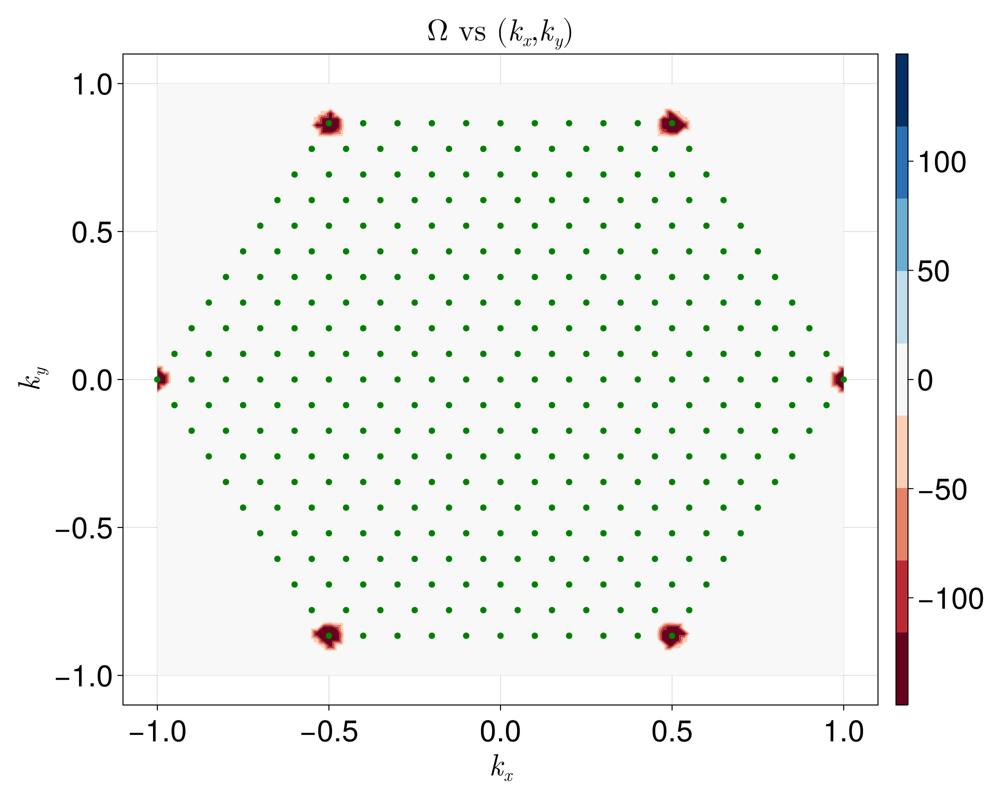

In [239]:
lambda = 2
rs = 1
kappa = 1
V = [[1, 0] [0, 0]]
shells = 3
index = 1
spacing = 10^(-1)
sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)

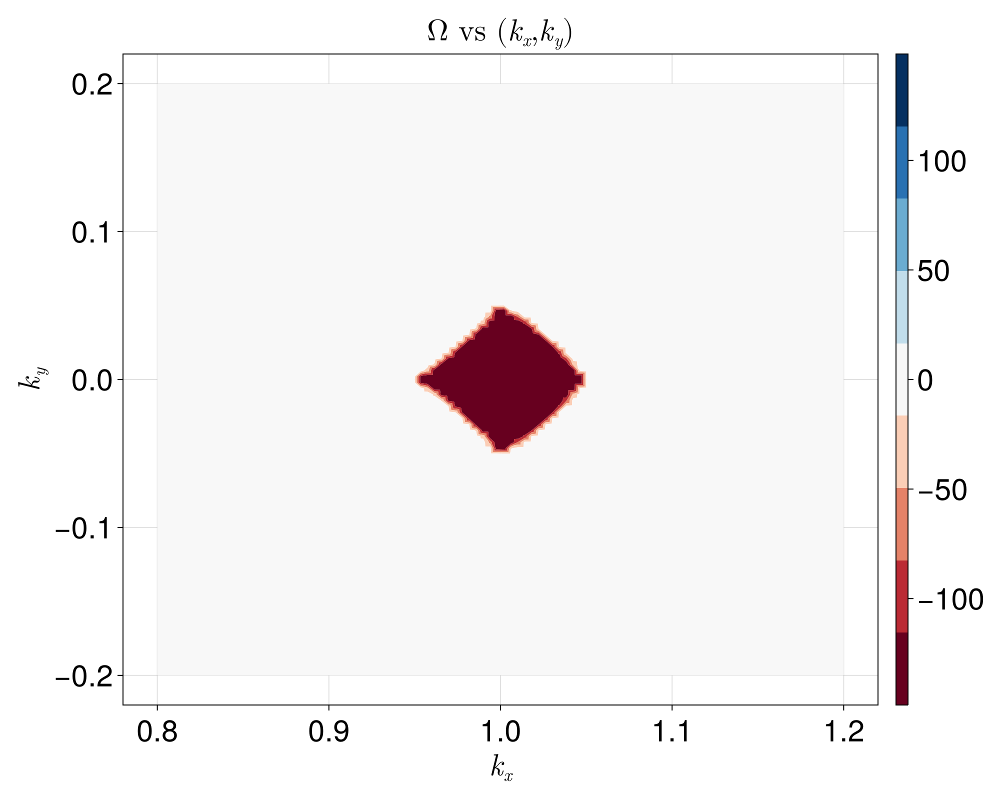

In [244]:
lambda = 2.5
rs = 1
kappa = 1
V = [[1, 0] [0, 0]]
shells = 3
index = 1
spacing = 10^(-1)
sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)

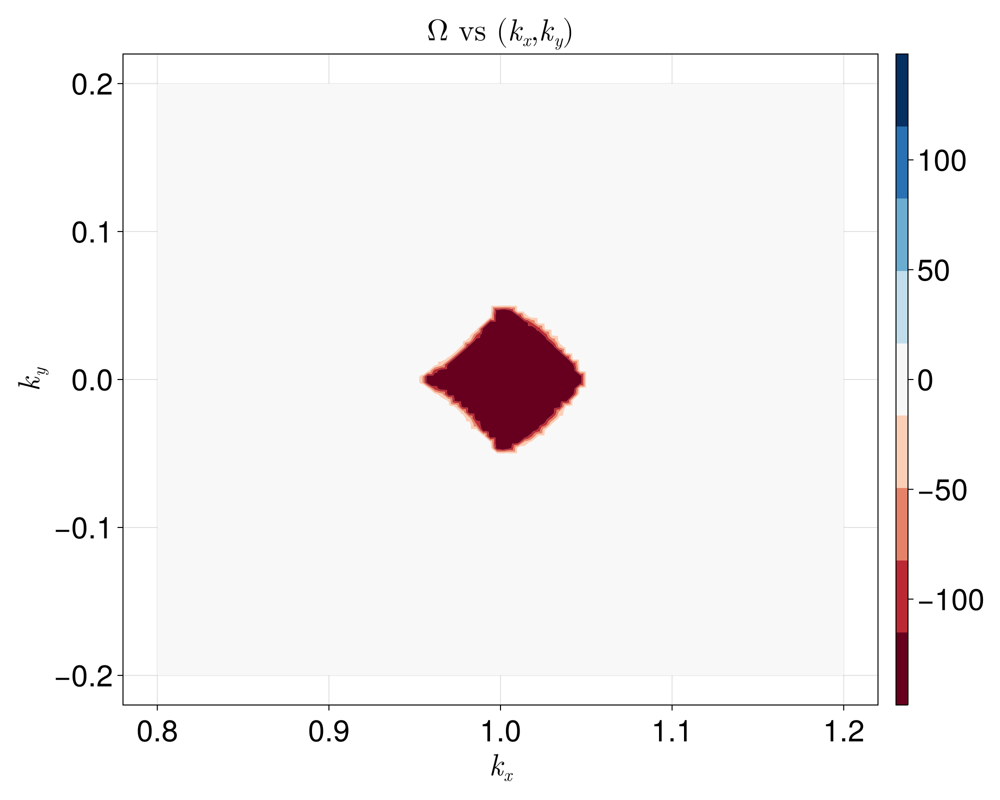

In [243]:
lambda = 4
rs = 1
kappa = 1
V = [[1, 0] [0, 0]]
shells = 3
index = 1
spacing = 10^(-1)
sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)

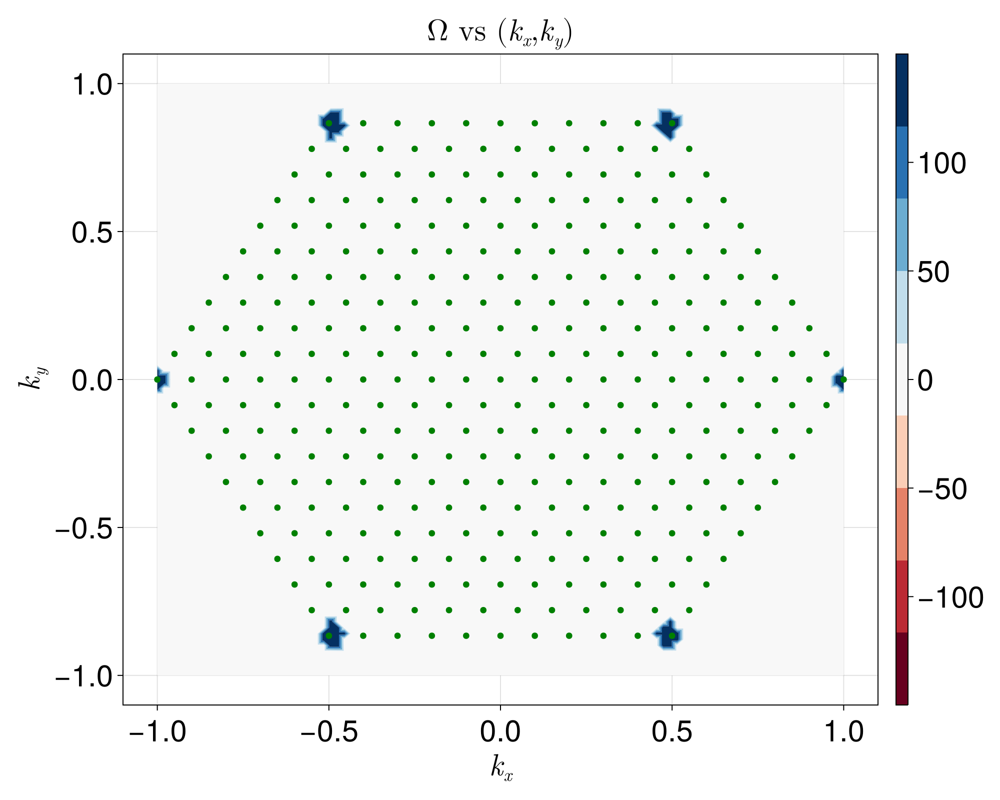

In [227]:
lambda = 0.07
rs = 1
kappa = 1
V = [[0, 0] [0, 1]]
shells = 3
index = 1
spacing = 10^(-1)
sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)

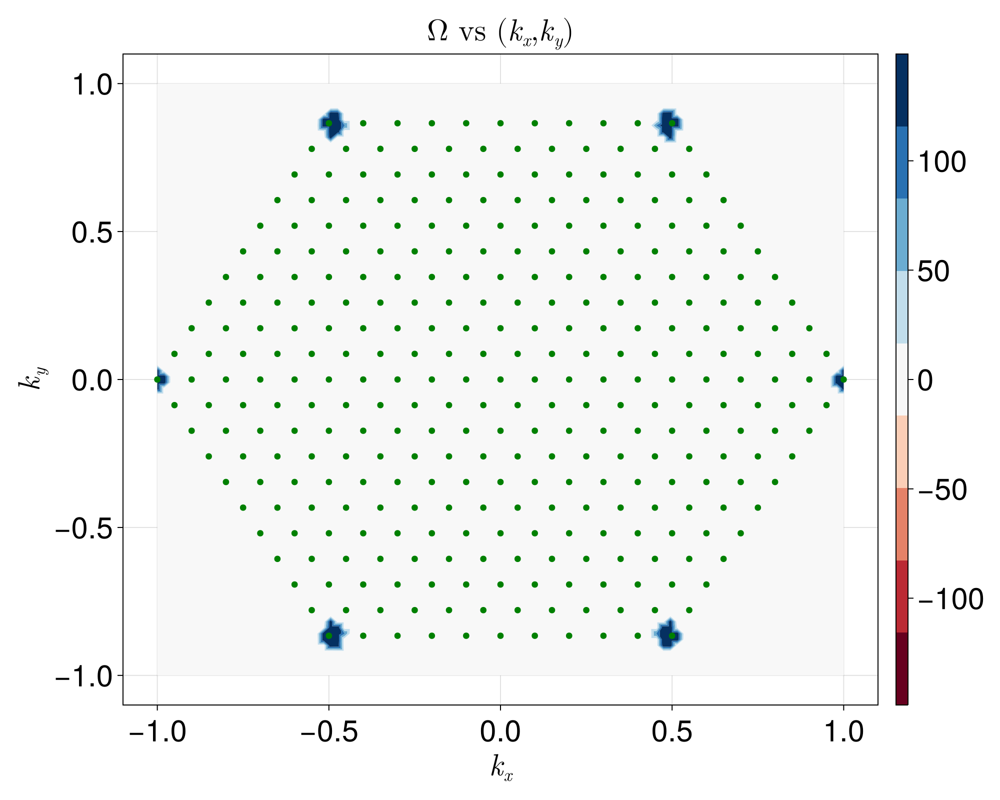

In [226]:
lambda = 0.15
rs = 1
kappa = 1
V = [[0, 0] [0, 1]]
shells = 3
index = 1
spacing = 10^(-1)
sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)

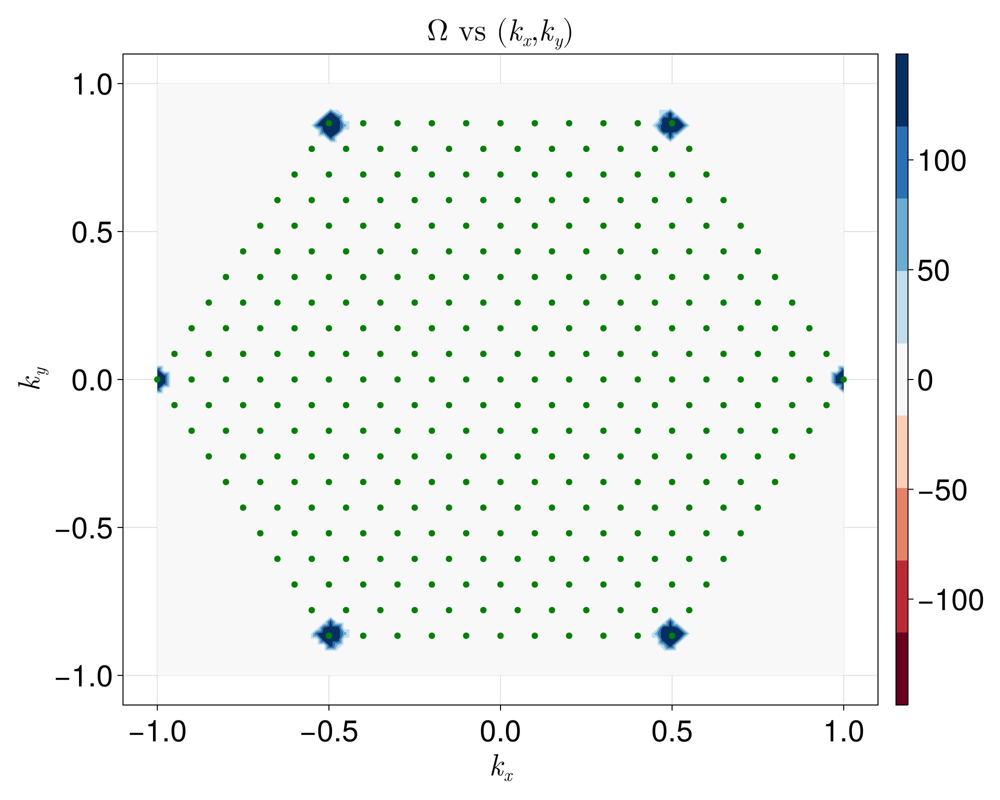

In [228]:
lambda = 0.25
rs = 1
kappa = 1
V = [[0, 0] [0, 1]]
shells = 3
index = 1
spacing = 10^(-1)
sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)

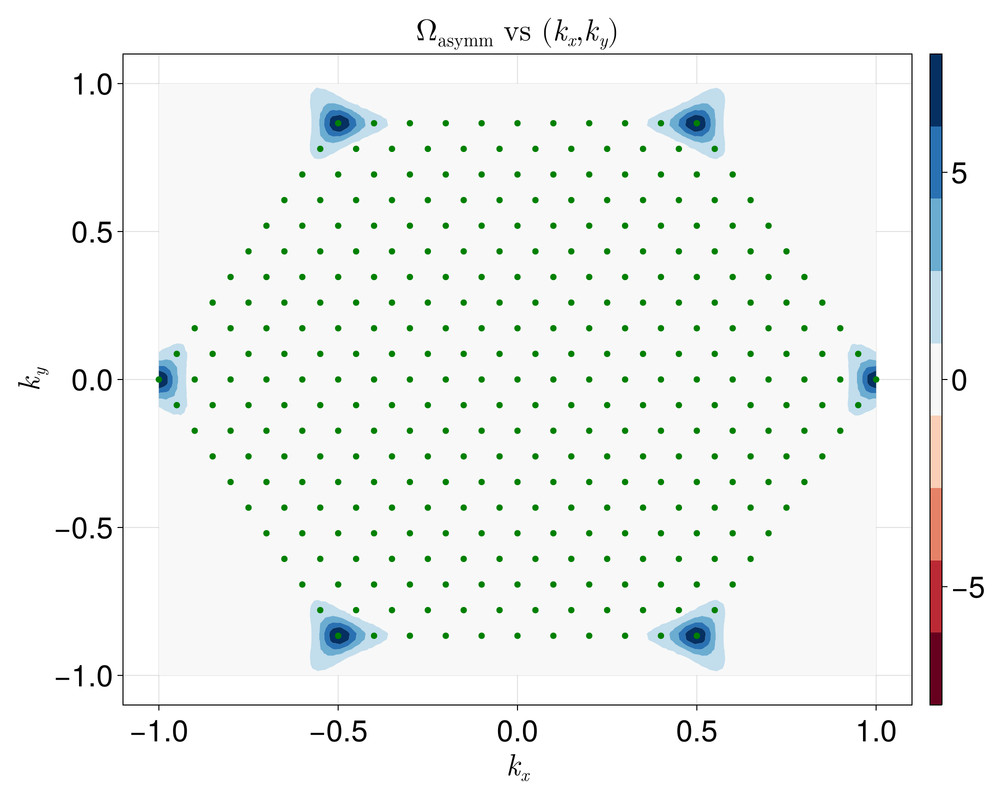

In [182]:
lambda = 0.5
rs = 1
kappa = 1
V = -0.1
shells = 3
index = 1
spacing = 10^(-1)
asymm_sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)

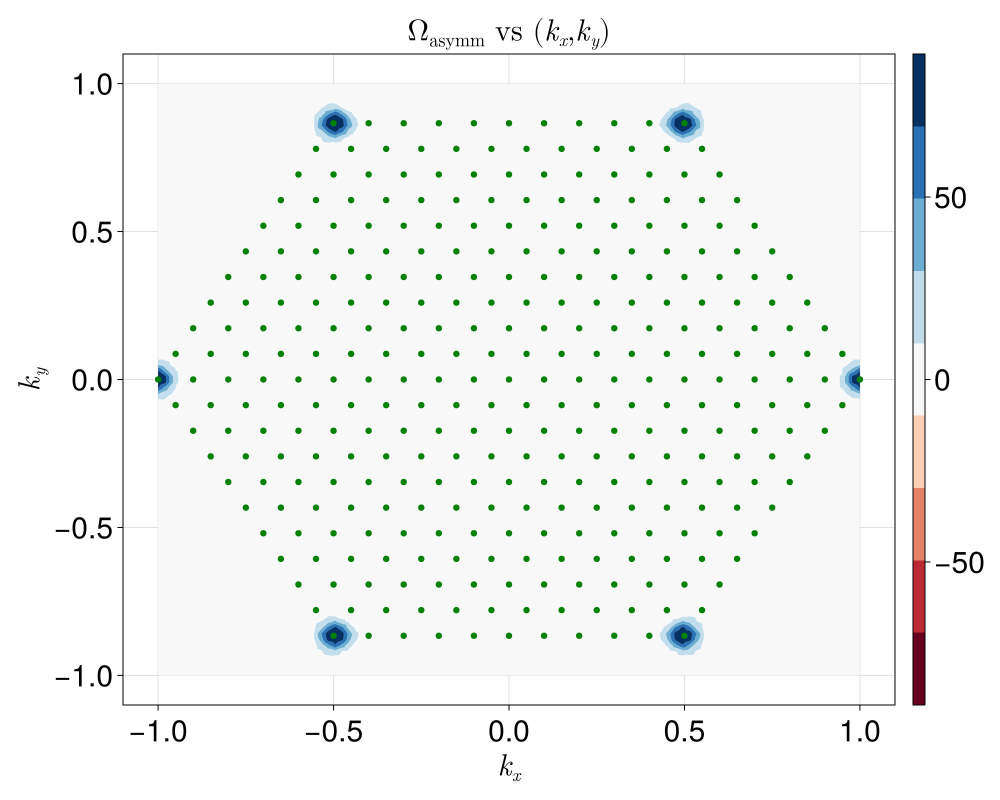

In [183]:
lambda = 2
rs = 1
kappa = 1
V = -0.1
shells = 3
index = 1
spacing = 10^(-1)
asymm_sample_diagnostic(lambda, rs, kappa, V, shells, index, spacing)